# Earthquake Clustering

Analizzerò il dataset SHEEC (SHare European Earthquake Catalog) per studiare le zone europee a più alto rischio sismico. 
Lo studio può essere utile per evidenziare queste zone a rischio e procedere all'adozione di strumenti e tecniche per prevenire eventuali disastri.

Il dataset copre l'intervallo temporale che va dal 1900 al 2006.
 
 
 ## Setup
 Importo dei moduli necessari per l'analisi del dataset.
 - matplotlib: ci servirà per il plot dei grafici
 - numPy: ci servirà per le nostre operazioni sui dati
 - pandas: tool più completo di numPy per operare sui dati. Può coesistere con numPy
 
Implemento una funzione per il salvataggio delle figure che verranno generate. 
Garantisco, inoltre, il funzionamento del notebook anche con versioni obsolete di Python.
 
Affronterò un problema di Clustering cercando di evidenziare le aree Europee a più alta esposizione sismica adottando gli algoritmi **K-means** e **DBSCAN**

In [7]:
# Python ≥3.5 is required
# import sys
# assert sys.version_info >= (3, 5)

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

# Common imports
import pandas as pd
import numpy as np
import os

import warnings
warnings.filterwarnings('ignore')

# to make this notebook's output stable across runs
np.random.seed(42)

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

# Where to save the figures
PROJECT_ROOT_DIR = "."
# CHAPTER_ID = "unsupervised_learning"
IMAGES_PATH = os.path.join(PROJECT_ROOT_DIR, "images")
os.makedirs(IMAGES_PATH, exist_ok=True)

def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = os.path.join(IMAGES_PATH, fig_id + "." + fig_extension)
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

# Ignore useless warnings (see SciPy issue #5998)
import warnings
warnings.filterwarnings(action="ignore", message="^internal gelsd")

hrule = lambda x : "="*x
Hrule = lambda x,y: "="*(x//2)+y+"="*(x//2)

# Explore the Data

Per prima cosa importo il dataset da analizzare mediante i tool offerti da Python

In [8]:
dataOriginal = pd.read_excel('Dataset/SHEEC_1900-2006.xls')
#creo una copia su cui lavorare
data = dataOriginal.copy()
data.head()

,y,mo,d,h,min,sec,lat,lon,depth,I,M,type,Mw,ref,main ref
0,1900,1,8,14.0,45.0,NaN,43.70,16.7,NaN,7,NaN,,4.9,HHM,EMEC
1,1900,1,14,9.0,53.0,NaN,43.50,27.0,10.0,7,5.9,w,5.9,Onc,EMEC
2,1900,1,21,0.0,39.0,NaN,46.17,14.5,7.0,4-5,NaN,,3.5,ZivS,EMEC
3,1900,1,27,7.0,20.0,NaN,43.60,16.7,NaN,7,NaN,,4.9,HHM,EMEC
4,1900,1,28,9.0,35.0,NaN,45.50,16.9,NaN,7,NaN,,4.9,HHM,EMEC


Analizzo dettagliatamente il significato di ogni attributo del dataset:
- y: Anno avvenimento dell'evento sismico
- mo: Mese avvenimento dell'evento sismico
- d: Giorno avvenimento dell'vento sismico
- h: Ora avvenimento dell'evento sismico
- min: Minuto avvenimento dell'evento sismico
- sec: Secondo avvenimento dell'evento sismico
- lat: Latitudine epicentro dell'evento sismico
- lon: Longitudine epicentro dell'evento sismico
- depth: Profondità epicentro dell'evento sismico
- I: Intensità dell'evento sismico (dato dalla scala Mercalli)
- M: Magnitudo
- type: Tipo di Magnitudo
- Mw: Magnitudo Momento
- ref: Fonte
- main ref: Principale fonte

C'è da fare una precisazione riguardo la Magnitudo:
    Il concetto di Magnitudo nacque nel 1935, quando Richter aveva necessità di esprimere in forma quantitativa la "forza" di un terremoto. 
    Esistono diverse forme di Magnitudo, ognuna con caratteristiche leggermente diverse, per esempio quella di Richter (Ml - Magnitudo Locale) può essere calcolata solo per terremoti che avvengono a distanza minore di 600 km dalla stazione che ha registrato l'evento.
    La migliore stima della reale grandezza del terremoto è data dalla Magnitudo Momento (Mw) introdotta negli anni '70 da Kanamori.
    
Per questo motivo nell'analisi considererò esclusivamente l'attributo Mw per definire la Magnitudo di ogni terremoto.

Posso analizzare le dimensioni del dataset, cioè il numero di *righe e colonne* e poi verificare la presenza o meno di *'missing values'*

In [9]:
print(Hrule(20, " Dimensione Dataset "))
print(data.shape)
print(Hrule(20, ' Informazioni attributi Dataset '))
data.info()
print()
print(Hrule(20," Percentuale di valori mancanti per attributo "))
pd.DataFrame(data.isnull().sum()/data.shape[0]).T

========== Dimensione Dataset ==========
(19126, 15)
========== Informazioni attributi Dataset ==========
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19126 entries, 0 to 19125
Data columns (total 15 columns):
y           19126 non-null int64
mo          19126 non-null int64
d           19126 non-null int64
h           18924 non-null float64
min         18755 non-null float64
sec         15620 non-null float64
lat         19126 non-null float64
lon         19126 non-null float64
depth       14504 non-null float64
I           19126 non-null object
M           17806 non-null float64
type        19126 non-null object
Mw          19126 non-null float64
ref         19126 non-null object
main ref    19126 non-null object
dtypes: float64(8), int64(3), object(4)
memory usage: 2.2+ MB

========== Percentuale di valori mancanti per attributo ==========


,y,mo,d,h,min,sec,lat,lon,depth,I,M,type,Mw,ref,main ref
0,0.0,0.0,0.0,0.010562,0.019398,0.183311,0.0,0.0,0.241661,0.0,0.069016,0.0,0.0,0.0,0.0


Noto che il Dataset è abbastanza completo, la percentuale più alta di valori mancanti (24 %) la trovo nella 'Profondità' dell'epicentro da cui parte il singolo terremoto.

L'attributo Mw non ha entry mancanti, mentre l'attributo M ha il 7 % di valori mancanti. Questo conferma la mia scelta di considerare come Magnitudo dei terremoti esclusivamente l'attributo Mw, cioè la Magnitudo Momento, che, come detto precedentemente, è la stima che più si avvicina alla reale 'grandezza' del terremoto.

Altri valori mancanti si hanno negli attributi delle ore (1 %), dei minuti (2%) e dei secondi (18 %); questo perchè alcune di queste informazioni non sono state registrate, soprattutto nella prima parte dell'intervallo temporale considerato nel dataset.

Analizzo le entries mediante altri strumenti matematici.

In [10]:
data.describe()

,y,mo,d,h,min,sec,lat,lon,depth,M,Mw
count,19126.000000,19126.000000,19126.000000,18924.000000,18755.000000,15620.000000,19126.000000,19126.000000,14504.000000,17806.000000,19126.000000
mean,1971.835303,6.348165,15.947140,11.341577,29.407998,29.887323,44.747625,11.112838,34.072808,4.390028,4.441340
std,28.396219,3.386977,8.736615,7.040097,17.135584,17.420724,9.764184,18.914575,41.015123,0.609381,0.559943
min,1900.000000,1.000000,1.000000,0.000000,0.000000,0.000000,33.200000,-31.650000,1.000000,2.500000,3.500000
25%,1957.000000,3.000000,9.000000,5.000000,15.000000,14.735000,38.000000,-0.950000,10.000000,4.100000,4.100000
50%,1980.000000,6.000000,16.000000,11.000000,30.000000,30.000000,41.690000,20.100000,16.000000,4.300000,4.400000
75%,1995.000000,9.000000,24.000000,18.000000,44.000000,45.000000,46.200000,25.677500,40.000000,4.700000,4.800000
max,2006.000000,12.000000,31.000000,23.000000,59.000000,59.970000,73.320000,33.940000,660.000000,8.300000,8.300000


Le informazioni più interessanti che posso derivare sono quelle che si riferiscono agli attributi **Mw** e **Depth**:
- **Mw**: la media delle Magnitudo registrate in Europa in questo arco temporale è di 4.4. Il dataset contiene tutti gli eventi sismici che hanno registrato una magnitudo di **almeno** 3.5, quelle inferiori a questa magnitudo non sono registrate. La magnitudo massima registrata in Europa in questi anni è pari ad 8.3.
- **Depth**: tenendo conto che ci sono dei valori mancanti per quanto riguarda questo attributo, possiamo comunque notare che la profondità minima registrata è di 1 km, mentre quella massima è di 660 km. La profondità media registrata è di 34 km

Un altro attributo interessante da analizzare sarebbe quello dell'**Intensità**.
L'intensità è un'altra metrica per 'misurare' un terremoto; ad essere presi in esame qui sono gli effetti sull'ambiente, sulle cose e sull'uomo. L'intensità si esprime con la scala Mercalli che si compone di 12 gradi: più il grado è alto più il terremoto è disastroso.

Il problema è che in questo Dataset i valori relativi all'attributo di Intensità non sono presenti, ma le celle si presentano vuote (non con il valore NaN ma con un 'carattere di spazio'). Quindi sostituisco il carattere di spazio con il valore NaN per verificare il numero di valori mancanti dell'attributo **I**

In [11]:
intensity = data['I']
intensity[intensity==' ']=np.nan
data['I'] = intensity
print(Hrule(20, ' Informazioni attributi Dataset '))
data.info()
print('\n')
print(Hrule(20, "Evidenzio i NaN dell'attributo I"))
data.tail()

========== Informazioni attributi Dataset ==========
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19126 entries, 0 to 19125
Data columns (total 15 columns):
y           19126 non-null int64
mo          19126 non-null int64
d           19126 non-null int64
h           18924 non-null float64
min         18755 non-null float64
sec         15620 non-null float64
lat         19126 non-null float64
lon         19126 non-null float64
depth       14504 non-null float64
I           3925 non-null object
M           17806 non-null float64
type        19126 non-null object
Mw          19126 non-null float64
ref         19126 non-null object
main ref    19126 non-null object
dtypes: float64(8), int64(3), object(4)
memory usage: 2.2+ MB


==========Evidenzio i NaN dell'attributo I==========


,y,mo,d,h,min,sec,lat,lon,depth,I,M,type,Mw,ref,main ref
19121,2006,12,29,21.0,44.0,26.21,45.96,-27.45,10.0,NaN,3.9,S,4.4,ISC,EMEC
19122,2006,12,30,5.0,2.0,30.55,39.79,-29.53,10.0,NaN,3.8,S,4.4,ISC,EMEC
19123,2006,12,31,13.0,39.0,23.39,47.40,19.34,5.0,6,4.1,L,3.8,Georisk,EMEC
19124,2006,12,31,14.0,16.0,43.00,39.27,-10.44,57.0,NaN,4.5,b,4.4,IGN10,EMEC
19125,2006,12,31,14.0,55.0,52.00,35.02,-4.09,7.0,NaN,4.3,b,4.2,IGN10,EMEC


In [12]:
print(Hrule(20," Percentuale di valori mancanti per attributo "))
pd.DataFrame(data.isnull().sum()/data.shape[0]).T

========== Percentuale di valori mancanti per attributo ==========


,y,mo,d,h,min,sec,lat,lon,depth,I,M,type,Mw,ref,main ref
0,0.0,0.0,0.0,0.010562,0.019398,0.183311,0.0,0.0,0.241661,0.794782,0.069016,0.0,0.0,0.0,0.0


Da questa nuova analisi noto che la percentuale più alta di valori mancanti per attributo risulta averla proprio l'attributo **I**. Infatti manca circa l'80 % dei valori che si riferiscono al grado di Intensità dei terremoti, una percentuale molto alta che di conseguenza non mi permette di considerare questo attributo nell'analisi del dataset.
Non posso considerarlo per lo studio perchè l'Intensità di un terremoto (considerato come una misura sugli effetti e sui danni provocati dal terremoto su persone, ambiente e cose) è altamente variabile e non è correlabile con il valore della Magnitudo. Perciò non sono in grado di approssimare i valori mancanti dell'Intensità in quanto i danni provocati da un terremoto dipendono fortemente dal luogo in cui questo avviene (quindi se la zona ha adottato politiche anti-sismiche per prevenire danni o meno, la presenza o meno del mare nelle vicinanze, ecc) e non è possibile ricavare una stima del grado della scala Mercalli a partire, per esempio, dalla Magnitudo del terremoto.
Terremoti forti in zone disabitate o con edifici antisismici non causano danni e hanno quindi gradi bassi di Intensità. Viceversa, piccoli terremoti in aree con costruzioni non adeguate possono provocare ingenti danni e determinare un alto grado di Intensità.

Stessa cosa succede per l'attributo 'type' che risulta essere completo (con nessun valore mancante), ma in realtà non è così. Infatti, come succede con l'Intensità, molti valori mancanti hanno il 'carattere di spazio' piuttosto che il valore NaN.

In [13]:
type1 = data['type']
type1[type1==' ']=np.nan
data['type'] = type1
print(Hrule(20, ' Informazioni attributi Dataset '))
data.info()
print('\n')
print(Hrule(20, " Evidenzio i NaN dell'attributo type "))
data.head()

========== Informazioni attributi Dataset ==========
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19126 entries, 0 to 19125
Data columns (total 15 columns):
y           19126 non-null int64
mo          19126 non-null int64
d           19126 non-null int64
h           18924 non-null float64
min         18755 non-null float64
sec         15620 non-null float64
lat         19126 non-null float64
lon         19126 non-null float64
depth       14504 non-null float64
I           3925 non-null object
M           17806 non-null float64
type        17807 non-null object
Mw          19126 non-null float64
ref         19126 non-null object
main ref    19126 non-null object
dtypes: float64(8), int64(3), object(4)
memory usage: 2.2+ MB


========== Evidenzio i NaN dell'attributo type ==========


,y,mo,d,h,min,sec,lat,lon,depth,I,M,type,Mw,ref,main ref
0,1900,1,8,14.0,45.0,NaN,43.70,16.7,NaN,7,NaN,NaN,4.9,HHM,EMEC
1,1900,1,14,9.0,53.0,NaN,43.50,27.0,10.0,7,5.9,w,5.9,Onc,EMEC
2,1900,1,21,0.0,39.0,NaN,46.17,14.5,7.0,4-5,NaN,NaN,3.5,ZivS,EMEC
3,1900,1,27,7.0,20.0,NaN,43.60,16.7,NaN,7,NaN,NaN,4.9,HHM,EMEC
4,1900,1,28,9.0,35.0,NaN,45.50,16.9,NaN,7,NaN,NaN,4.9,HHM,EMEC


In [14]:
print(Hrule(20," Percentuale di valori mancanti per attributo "))
pd.DataFrame(data.isnull().sum()/data.shape[0]).T

========== Percentuale di valori mancanti per attributo ==========


,y,mo,d,h,min,sec,lat,lon,depth,I,M,type,Mw,ref,main ref
0,0.0,0.0,0.0,0.010562,0.019398,0.183311,0.0,0.0,0.241661,0.794782,0.069016,0.068964,0.0,0.0,0.0


Da questa ulteriore analisi ho verificato che le entry dell'attributo 'type' non sono complete ma c'è circa il 7% di valori mancanti.
_____________

Dando un'altra occhiata alle informazioni sui valori delle entries per ogni attributo, noto che sono tutti valori numerici eccetto per l'*Intensità*, il *Tipo* di Magnitudo, la *Fonte* e la *Fonte principale*.

In un dataset con più di 19000 entries è doveroso elencare le fonti dalle quali sono ricavate queste informazioni.

In [15]:
data['main ref'].value_counts()

EMEC      13587
MKK12      5460
CPTI04       57
NORSAR       22
Name: main ref, dtype: int64

Posso notare che la maggior parte delle informazioni contenute in questo dataset proviene dall'EMEC (European-Mediterranean Earthquake Catalogue) con più di 13000 entries sulle circa 19000 totali.

Attraverso il plotting di grafi relativi ai vari attributi del dataset posso catturare più facilmente alcuni aspetti della distribuzione dei valori.

Saving figure attribute_histogram_plots


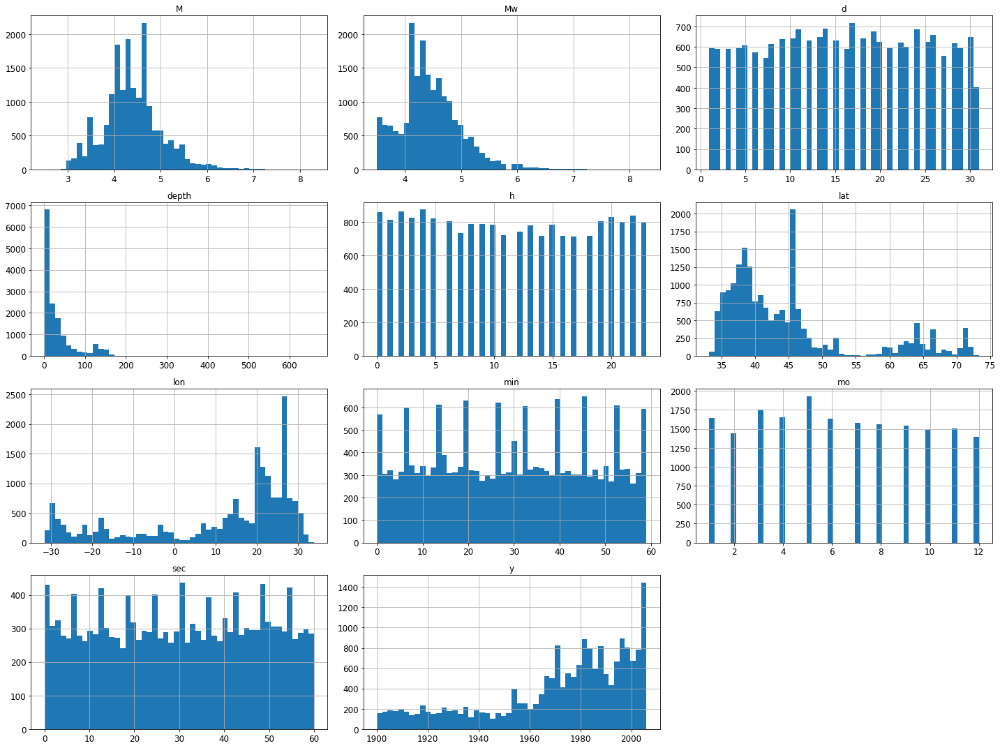

In [16]:
data.hist(bins=50, figsize=(20,15))
save_fig("attribute_histogram_plots")
plt.show()

La visualizzazione dei grafici relativi ai valori degli attributi mette in risalto nuove caratteristiche che prima erano difficili da notare.
Penso non siano interessanti i grafici relativi a:
- *giorno*
- *mese*
- *ora*
- *minuto*
- *secondo*

Per quanto riguarda i valori di **M e Mw**, hanno delle distribuzioni abbastanze diverse, ma da subito ho deciso di considerare la sola Magnitudo Momento *Mw* (considerata la stima più attendibile)

Risultano interessanti le distribuzioni di **depth** (profondità), **lat** e **long** (latitudine e longitudine) e **y** (year).

## Depth
In Depth noto un picco nei valori iniziali dell'ascisse, questo vuol dire che l'epicentro della maggior parte dei terremoti non avviene ad una profondità elevata. Non bisogna dimenticarsi, però, dei valori mancanti; infatti per l'attributo *depth* abbiamo il 24 % dei valori mancanti.

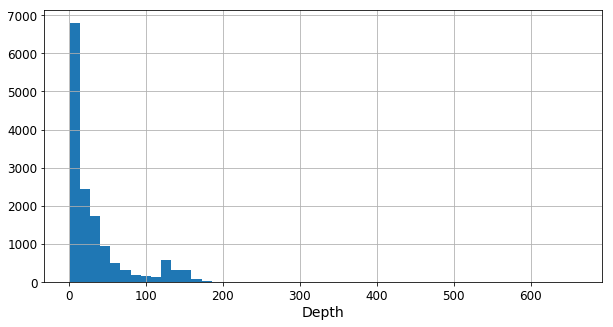

Saving figure depth


<Figure size 432x288 with 0 Axes>

In [17]:
depth = data['depth']

depth.hist(bins=50, figsize=(10,5))
plt.xlabel("Depth")
plt.show()
save_fig("depth")

## Latitude and Longitude
Analizzando i grafici inerenti a **latitudine e longitudine** noto dei picchi a circa 45° per la latitudine e 26° per la longitudine.
Questi grafici non mi danno informazioni molto utili, perchè non evidenziano la zona con più eventi sismici. Infatti, in questo caso, latitudine e longitudine sono indipendenti tra loro. 

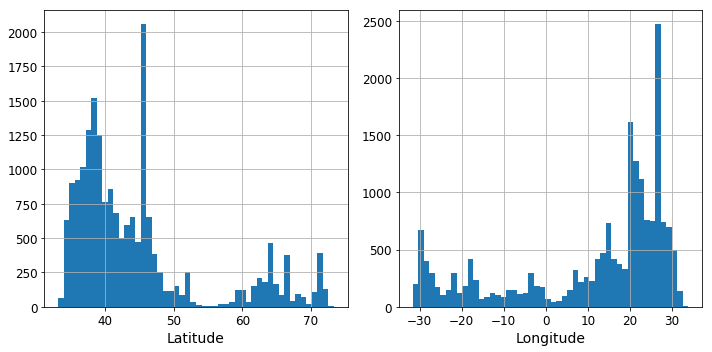

Saving figure latitude_longitude


<Figure size 432x288 with 0 Axes>

In [18]:
plt.subplot(1,2,1)
pl1 = data['lat'].hist(bins=50,figsize=(10,5))
plt.xlabel('Latitude')

plt.subplot(1,2,2)
pl2 = data['lon'].hist(bins=50,figsize=(10,5))
plt.xlabel('Longitude')

plt.tight_layout()
plt.show()
save_fig('latitude_longitude')

## Year
Dal grafico inerente l'anno si nota come viene registrato un picco negli ultimi anni registrati nel dataset. 
Analizzo dettagliatamente il grafico per capire l'anno specifico.

Saving figure year_histogram


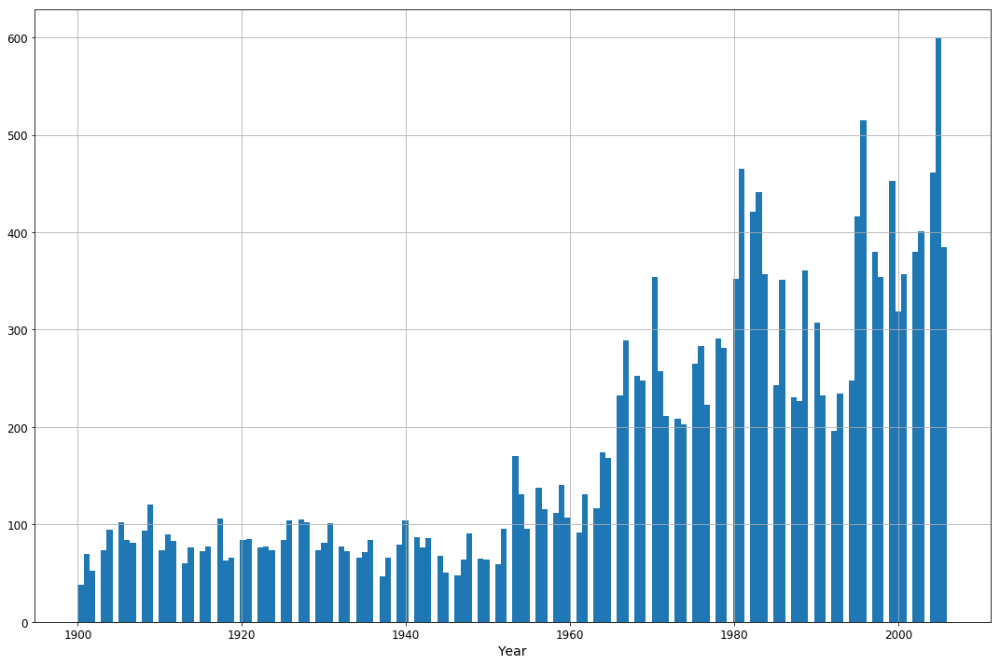

In [19]:
data['y'].hist(bins=150, figsize=(15,10))
plt.xlabel('Year')
save_fig('year_histogram')

In [20]:
data['y'].value_counts().head()

2005    599
1996    515
1981    465
2004    461
1999    453
Name: y, dtype: int64

Quindi da questa analisi l'anno che ha registrato un maggior numero di eventi sismici risulta essere il 2005.

# Visualize the Data
Cerco di visualizzare graficamente i dati contenuti nel dataset attraverso uno *scatter plot*

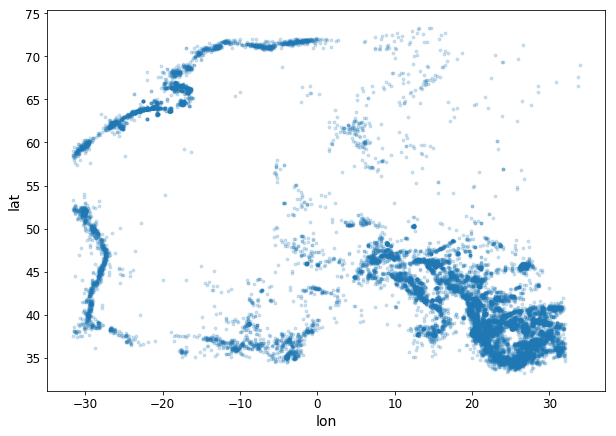

In [21]:
# scatter plot of longitude and latitude
data.plot(kind="scatter", x="lon", y="lat", alpha=0.2, figsize=(10,7), s=8)

I dati rappresentati in questo modo non riescono, però, a comunicarmi molto. E' utile sovrapporre i marker dello scatter plot su una mappa.

Saving figure map_scatter_plot


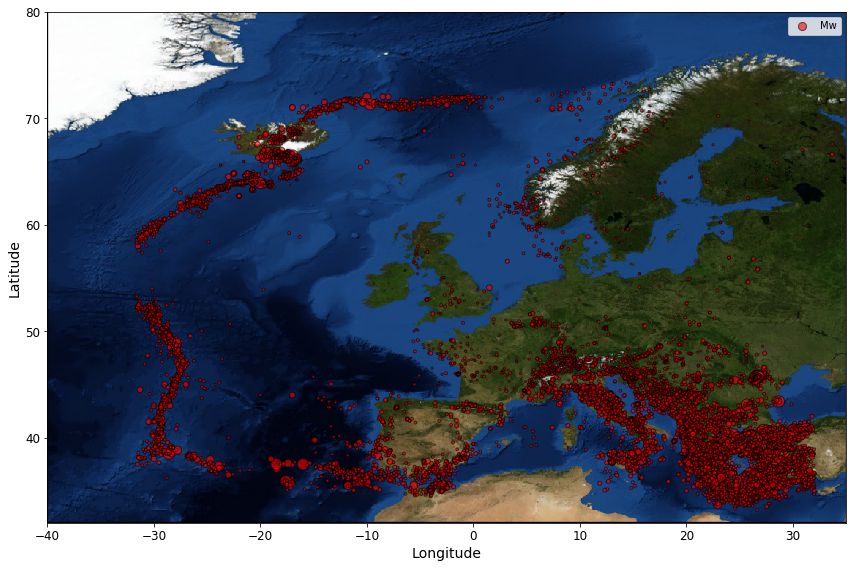

In [22]:
import matplotlib.image as mpimg

def size():
    lista= []
    for i in data['Mw']:
        if(3.5 <= i < 4): lista.append(4)
        elif(4 <= i < 4.75): lista.append(8)
        elif(4.75 <= i < 5.50): lista.append(16)
        elif(5.50 <= i < 6.25): lista.append(32)
        elif(6.25 <= i < 7):lista.append(64)
        elif( i >= 7): lista.append(128)
        else: lista.append(1)
    return lista
    

ax = data.plot(kind="scatter", x="lon", y="lat",color='r', edgecolors='k', s=np.array(size()), label='Mw', alpha=0.6, figsize=(12,9))
europa_img=mpimg.imread('europa.png')
plt.imshow(europa_img, extent=[-40, 35, 32, 80], alpha=1)
plt.ylabel("Latitude", fontsize=14)
plt.xlabel("Longitude", fontsize=14)

save_fig("map_scatter_plot")


Adesso l'analisi risulta essere più leggibile, infatti sovrapponendo lo scatterplot alla mappa, con le giuste coordinate, posso verificare dettagliatamente dove i terremoti si sono verificati. Più il raggio del marker è elevato più alta è la Magnitudo del terremoto registrato.

Da subito si può notare come la concentrazione di eventi sismici sia soprattutto in Grecia e in Italia.

# Pre-Processing
Questa è la fase in cui i dati vengono preparati per poter fare le elaborazioni richieste. Infatti molto spesso i dataset contengono errori oppure hanno un'alta percentuale di valori mancanti.
- **Data Cleaning**: questa è la fase in cui vengono rimpiazzati i valori mancanti, per esempio attraverso il valore mediano del determinato attributo.
- **Data Transformation**: in questa fase si trasformano i valori da un formato ad un altro, in maniera tale da poterci lavorare adeguatamente.
- **Data Reduction**: si cerca di ridurre la dimensione del dataset per permettere l'analisi dei dati effettivamente rilevanti. E' anche quella fase in cui si cerca di ridurre la dimensionalità (il numero di attributi) del dataset.
- **Data Integration**: è la fase in cui si vogliono mescolare dati da più dataset e offrire un'unica vista di questi dati.

Per l'analisi in esame ci sarà una fase di *Data Cleaning* e una di *Data Reduction*

## Data Reduction
Per prima cosa avvio la fase di *Data Reduction* mediante la tecnica di *Feature Selection*, cioè non considero le colonne di attributi che non sono utili per l'analisi (perchè hanno un'alta percentuale di valori mancanti o perchè i valori non danno informazioni valide per l'analisi).

In [23]:
data.head()

,y,mo,d,h,min,sec,lat,lon,depth,I,M,type,Mw,ref,main ref
0,1900,1,8,14.0,45.0,NaN,43.70,16.7,NaN,7,NaN,NaN,4.9,HHM,EMEC
1,1900,1,14,9.0,53.0,NaN,43.50,27.0,10.0,7,5.9,w,5.9,Onc,EMEC
2,1900,1,21,0.0,39.0,NaN,46.17,14.5,7.0,4-5,NaN,NaN,3.5,ZivS,EMEC
3,1900,1,27,7.0,20.0,NaN,43.60,16.7,NaN,7,NaN,NaN,4.9,HHM,EMEC
4,1900,1,28,9.0,35.0,NaN,45.50,16.9,NaN,7,NaN,NaN,4.9,HHM,EMEC


Infatti, nella prima parte dell'analisi, abbiamo supposto di considerare solo la **Magnitudo Momento**, in quanto questa stima è quella che più si avvicina ai reali effetti del terremoto ed inoltre mi permette di usare una stessa unità di musira per ogni evento sismico registrato nel dataset.
I valori registrati nell'attributo 'M' variano in base alla località in cui è avvenuto il terremoto, infatti la misura standard registrata varia rispetto alla zona in cui viene registrato il terremoto. All'attributo 'M' possono riferirsi diversi tipo di Magnitudo (Ml, Mw, Ms, Mb, Md); per rendere uniforme l'analisi ho scelto di considerare solo la *Magnitudo Momento* (Mw).

Non considero, quindi, l'intera colonna dell'attributo 'M' (che, tra le altre cose, ha il 6% di valori mancanti) e di conseguenza nemmeno la colonna 'type' che specificava il tipo di Magnitudo registrata.

In [24]:
data = data.drop(columns=['type','M'])
data.head()

,y,mo,d,h,min,sec,lat,lon,depth,I,Mw,ref,main ref
0,1900,1,8,14.0,45.0,NaN,43.70,16.7,NaN,7,4.9,HHM,EMEC
1,1900,1,14,9.0,53.0,NaN,43.50,27.0,10.0,7,5.9,Onc,EMEC
2,1900,1,21,0.0,39.0,NaN,46.17,14.5,7.0,4-5,3.5,ZivS,EMEC
3,1900,1,27,7.0,20.0,NaN,43.60,16.7,NaN,7,4.9,HHM,EMEC
4,1900,1,28,9.0,35.0,NaN,45.50,16.9,NaN,7,4.9,HHM,EMEC


Dopo aver specificato le fonti dalle quali questo dataset ha ricavato i valori registrati, le colonne relative agli attributi 'ref' e 'main ref' risultano anche esse inutili per quanto riguarda le operazioni di analisi da fare sul dataset.

In [25]:
data = data.drop(columns=['ref','main ref'])
data.head()

,y,mo,d,h,min,sec,lat,lon,depth,I,Mw
0,1900,1,8,14.0,45.0,NaN,43.70,16.7,NaN,7,4.9
1,1900,1,14,9.0,53.0,NaN,43.50,27.0,10.0,7,5.9
2,1900,1,21,0.0,39.0,NaN,46.17,14.5,7.0,4-5,3.5
3,1900,1,27,7.0,20.0,NaN,43.60,16.7,NaN,7,4.9
4,1900,1,28,9.0,35.0,NaN,45.50,16.9,NaN,7,4.9


Sempre nella prima parte dell'analisi ho verificato che la percentuale di valori mancanti relativi all'attributo 'I' è pari a circa l'80%. In questi casi la cosa migliore da fare è quella di eliminare l'intera colonna dell'attributo in quanto il numero di valori mancanti è troppo elevato e non è possibile rimediare a questa mancanza di informazioni nemmeno nella fase di Data Cleaning.

In [26]:
data = data.drop(columns=['I'])
data.head()

,y,mo,d,h,min,sec,lat,lon,depth,Mw
0,1900,1,8,14.0,45.0,NaN,43.70,16.7,NaN,4.9
1,1900,1,14,9.0,53.0,NaN,43.50,27.0,10.0,5.9
2,1900,1,21,0.0,39.0,NaN,46.17,14.5,7.0,3.5
3,1900,1,27,7.0,20.0,NaN,43.60,16.7,NaN,4.9
4,1900,1,28,9.0,35.0,NaN,45.50,16.9,NaN,4.9


## Data Cleaning
Qui cerco di rimpiazzare i valori mancanti delle entries nel dataset.

In [27]:
print(Hrule(20," Percentuale di valori mancanti per attributo "))
pd.DataFrame(data.isnull().sum()/data.shape[0]).T

========== Percentuale di valori mancanti per attributo ==========


,y,mo,d,h,min,sec,lat,lon,depth,Mw
0,0.0,0.0,0.0,0.010562,0.019398,0.183311,0.0,0.0,0.241661,0.0


Visualizzando la percentuale di valori mancanti per gli attributi che ho deciso di considerare, dovrei fare delle operazioni di *data cleaning* su:
- h (~1%)
- min (~2%)
- sec (~18%)
- depth (~24%)

Per quanto riguarda gli attributi temporali, questa assenza di valori è dovuta al fatto che, soprattutto nei primi anni del Novecento, non si prestava la stessa attenzione dei tempi recenti nella registrazione di questi eventi sismici; era sufficiente la registrazione di gg/mm/yyyy.
Tuttavia, la percentuale di valori mancanti per gli attributi delle *ore* e dei *minuti* è veramente bassa (rispettivamente ~1% e ~2%); quella dei *secondi* è più alta (~18%), ma questa non è un'informazioni strettamente necessaria.

Sostituisco tutti i valori temporali pari ad NaN con il float '-1.0', che sta a significare che l'informazione non è stata registrata.

In [28]:
data['h'].fillna(-1, inplace=True)
data['min'].fillna(-1, inplace=True)
data['sec'].fillna(-1, inplace=True)
print(Hrule(20, ' Informazioni attributi Dataset '))
data.info()
print('\n')
print(Hrule(20, " Dataset "))
data.head()

========== Informazioni attributi Dataset ==========
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19126 entries, 0 to 19125
Data columns (total 10 columns):
y        19126 non-null int64
mo       19126 non-null int64
d        19126 non-null int64
h        19126 non-null float64
min      19126 non-null float64
sec      19126 non-null float64
lat      19126 non-null float64
lon      19126 non-null float64
depth    14504 non-null float64
Mw       19126 non-null float64
dtypes: float64(7), int64(3)
memory usage: 1.5 MB


========== Dataset ==========


,y,mo,d,h,min,sec,lat,lon,depth,Mw
0,1900,1,8,14.0,45.0,-1.0,43.70,16.7,NaN,4.9
1,1900,1,14,9.0,53.0,-1.0,43.50,27.0,10.0,5.9
2,1900,1,21,0.0,39.0,-1.0,46.17,14.5,7.0,3.5
3,1900,1,27,7.0,20.0,-1.0,43.60,16.7,NaN,4.9
4,1900,1,28,9.0,35.0,-1.0,45.50,16.9,NaN,4.9


In [29]:
print(Hrule(20," Percentuale di valori mancanti per attributo "))
pd.DataFrame(data.isnull().sum()/data.shape[0]).T

========== Percentuale di valori mancanti per attributo ==========


,y,mo,d,h,min,sec,lat,lon,depth,Mw
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.241661,0.0


A questo punto ho sostituito tutti valori NaN degli attributi temporali con '-1' per notificare l'assenza di registrazione di questi attributi per un determinato evento sismico. Non avrebbe avuto nessun significato calcolare la mediana (o qualche altra stima) degli attributi temporali per sostituire il valore NaN.

Adesso devo fare operazioni di Data Cleaning solo sull'attributo 'depth'.
Voglio sostituire il 24% dei valori mancanti dell'attributo 'depth' con la mediana dei valori registrati per quell'attributo.
Infatti la mediana è una misura che più si presta all'approssimazione di questo genere di dati, la media risentirebbe troppo dei valori atipici (cioè gli outlier, quei valori che sono "lontani" rispetto ai dati osservati).

==========Media==========
34.07280750137893 

==========Mediana==========
16.0 

Saving figure depth_histogram_plots


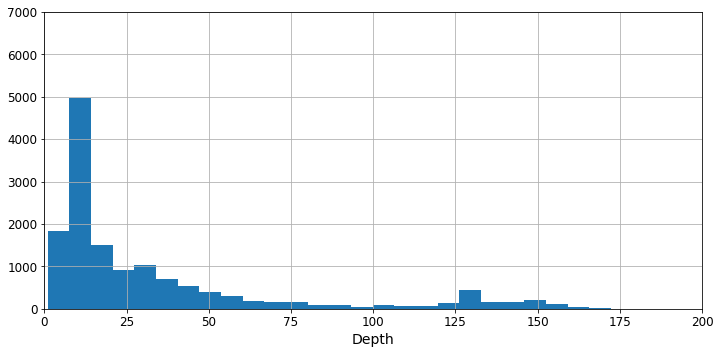

In [30]:
print(Hrule(20,"Media"))
tmp=data['depth'].mean()
print(tmp,"\n")
print(Hrule(20,"Mediana"))
tmp=data['depth'].median()
print(tmp,"\n")

depth=data['depth']
depth.hist(bins=100, figsize=(10,5))
plt.xlabel("Depth")
save_fig("depth_histogram_plots")

axes = plt.gca()
axes.set_xlim([0,200])
axes.set_ylim([0,7000])
plt.show()

Focalizzandomi nei primi intervalli dell'asse x, mi accorgo che la profondità assunta dalla maggior parte dei terremoti si trova nell'intervallo (0,25), dato concorde con l'approssimazione dei valori NaN con la loro mediana (pari a 16 km) piuttosto che con la sua media (pari a 34 km).

Quindi posso procedere con l'approssimazione dei valori NaN di 'depth' con la *mediana* registrata per quell'attributo.

In [31]:
from sklearn.preprocessing import Imputer

imputer = Imputer(missing_values = 'NaN', strategy = 'median', axis = 1)

#array tmp per fare le operazioni per poi applicare l'imputer
tmp = np.array(data['depth'])
#copia del dataframe originale per fare le operazioni senza portare l'originale in uno stato consistente
data2 = data.copy() 
data2 = data2.drop(columns=['depth'])
tmp = tmp.reshape(1,-1)
imputer = imputer.fit(tmp)
tmp = imputer.transform(tmp)
tmp = tmp.reshape(-1,1)
data2['depth']=tmp[:]
data2.head()

,y,mo,d,h,min,sec,lat,lon,Mw,depth
0,1900,1,8,14.0,45.0,-1.0,43.70,16.7,4.9,16.0
1,1900,1,14,9.0,53.0,-1.0,43.50,27.0,5.9,10.0
2,1900,1,21,0.0,39.0,-1.0,46.17,14.5,3.5,7.0
3,1900,1,27,7.0,20.0,-1.0,43.60,16.7,4.9,16.0
4,1900,1,28,9.0,35.0,-1.0,45.50,16.9,4.9,16.0


Le operazioni eseguite nel dataframe di copia mi sembrano coerenti, quindi posso sovrascrivere il dataframe di supporto creato appositamente per le operazioni di approssimazioni dell'attributo 'depth' con il dataframe iniziale.

In [32]:
data = data2
data.head()

,y,mo,d,h,min,sec,lat,lon,Mw,depth
0,1900,1,8,14.0,45.0,-1.0,43.70,16.7,4.9,16.0
1,1900,1,14,9.0,53.0,-1.0,43.50,27.0,5.9,10.0
2,1900,1,21,0.0,39.0,-1.0,46.17,14.5,3.5,7.0
3,1900,1,27,7.0,20.0,-1.0,43.60,16.7,4.9,16.0
4,1900,1,28,9.0,35.0,-1.0,45.50,16.9,4.9,16.0


Adesso il dataframe non ha nessun valore mancante.

In [33]:
print(Hrule(20," Percentuale di valori mancanti per attributo "))
pd.DataFrame(data.isnull().sum()/data.shape[0]).T

========== Percentuale di valori mancanti per attributo ==========


,y,mo,d,h,min,sec,lat,lon,Mw,depth
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Data Transformation e Data Integration

- **Data Transformation**: fortunatamente non devo procedere a nessuna procedura di trasformazione dei valori da un formato ad un altro. Infatti tutti i valori sono di tipo numerico, il formato giusto per eseguire le future analisi.
- **Data Integration**: per lo studio in oggetto non ho necessità di integrare questo dataset con altri dataset esterni.

# **I Parte** 

# **Clustering**
Attraverso la *Cluster Analysis* voglio trovare gruppi di oggetti che sono simili tra loro. 

Gli oggetti in questo caso sono i terremoti. Attraverso la clusterizzazione creo dei gruppi tali che i terremoti avvenuti in una stessa zona appartengano ad uno stesso cluster.

Gli algoritmi più usati per il problema della clusterizzazione sono: **K-Means e DBSCAN**.

# K-Means
Algoritmo di Clustering di tipo 'Partitional'. Deve essere specificato apriori il numero *k* di cluster; ogni cluster è associato ad un centroide (cioè il punto che si trova al centro del cluster) ed ogni punto è assegnato al cluster con il centroide più vicino.

#### K-Means Algorithm
<img src="images/k-means_algorithm.png"  />


La parte cruciale è scegliere il giusto numero di cluster da considerare.

A volte il numero di Cluster può essere scelto semplicemente osservando la distribuzione dei dati.

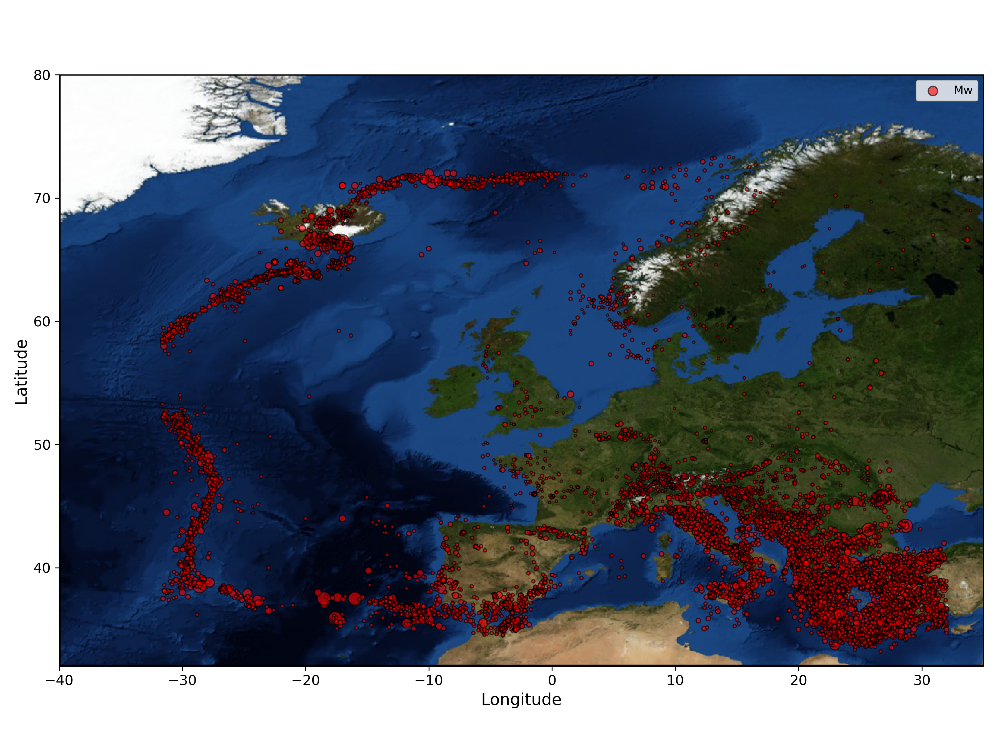

In [34]:
from IPython.display import Image
import os
IMG_PATH = "./images" 
Image(filename=os.path.join(IMG_PATH, 'map_scatter_plot.png'), width=1000)

Osservando lo scatter plot del dataset in esame probabilmente sono sufficienti 4 o 5 cluster. 

Una misura per la scelta del giusto numero di cluster la si può ottenere attraverso 2 tecniche:
* **Elbow Method**
* **Silhouette Coefficient**

## Preparazione della struttura dati 
Estraggo dal dataset in esame esclusivamente le colonne di *latitudine e longitudine* poichè saranno le coordinate *x e y* del piano cartesiano.

In [35]:
coordinates = data.as_matrix(columns=data.columns[6:8])
coordinates

array([[ 43.7 ,  16.7 ],
       [ 43.5 ,  27.  ],
       [ 46.17,  14.5 ],
       ...,
       [ 47.4 ,  19.34],
       [ 39.27, -10.44],
       [ 35.02,  -4.09]])

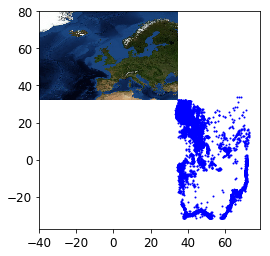

In [36]:
plt.imshow(europa_img, extent=[-40, 35, 32, 80], alpha=1)
plt.scatter(coordinates[:, 0], coordinates[:, 1], c='b', s=1)

Come mostra il grafico appena plottato devo invertire l'ordine delle colonne per far combaciare i valori di (latitudine, longitudine) con il piano cartesiano.

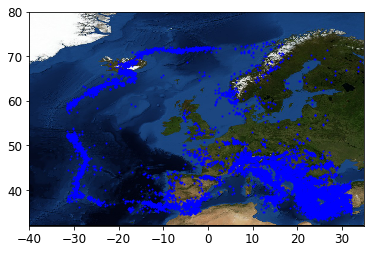

In [37]:
coordinates = np.flip(coordinates, axis=1)
plt.imshow(europa_img, extent=[-40, 35, 32, 80], alpha=1)
plt.scatter(coordinates[:, 0], coordinates[:, 1], c='b', s=1)

## Elbow Method
"Metodo a Gomito" 
Simula un numero K di cluster che varia nell'intervallo (1,10), quindi calcola per ogni simulazione la somma dei quadrati degli scarti dai centroidi e li mappa su un piano cartesiano. 

Il risultato sarà una curva che, in corrispondenza di un certo valore, assumerà una forma "a gomito". Tutti i valori successivi al punto di **'Elbow'** potranno assumere dei miglioramenti che non sono consistenti, perciò viene considerato il valore di Elbow come numero ottimale di cluster.

Saving figure elbow_method


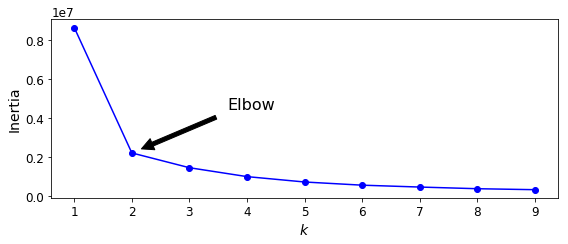

In [38]:
from sklearn.cluster import KMeans

kmeans_per_k = [KMeans(n_clusters=k, random_state=42).fit(coordinates)
                for k in range(1, 10)]
inertias = [model.inertia_ for model in kmeans_per_k]
plt.figure(figsize=(8, 3.5))
plt.plot(range(1, 10), inertias, "bo-")
plt.xlabel("$k$", fontsize=14)
plt.ylabel("Inertia", fontsize=14)
plt.annotate('Elbow',
             xy=(2, inertias[1]),
             xytext=(0.4, 0.55),
             textcoords='figure fraction',
             fontsize=16,
             arrowprops=dict(facecolor='black', shrink=0.1)
            )
save_fig("elbow_method")
plt.show()

## Silhouette Coefficient
Quest'altra tecnica è più affidabile rispetto ad *Elbow Method*. Consiste nel considerare il *Silhouette Score* per la scelta del numero ottimale di cluster. Il *Silhouette Score* è la media tra i *Silhouette Coefficient* dei punti del dataset.

Il *Silhouette Coefficient* si calcola:
$$silhouette(x) = \frac{(b - a)}{\max(a, b)}$$

- $a$ è la distanza media tra il punto $x$ e le altre istanze dello stesso cluster.
- $b$ è la distanza media tra il punto $x$ e le istanze del cluster più vicino.

Il coefficiente di silhouette può assumere valori nell'intervallo [-1,1]. Quando il valore è prossimo a +1 significa che l'istanza è in una posizione ottima nel proprio cluster e lontana dagli altri cluster; quando è prossimo allo 0 significa che è molto vicino al bordo del cluster; quando, invece, è prossimo a -1 significa che non è stato inserito nel cluster corretto.

Saving figure silhouette_coefficient


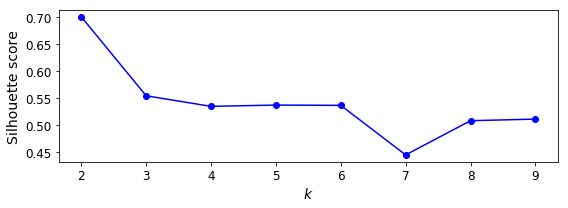

In [39]:
from sklearn.metrics import silhouette_score
silhouette_scores = [silhouette_score(coordinates, model.labels_)
                     for model in kmeans_per_k[1:]]
plt.figure(figsize=(8, 3))
plt.plot(range(2, 10), silhouette_scores, "bo-")
plt.xlabel("$k$", fontsize=14)
plt.ylabel("Silhouette score", fontsize=14)
save_fig("silhouette_coefficient")
plt.show()

Sia tramite *Elbow Method* che con il calcolo del *Silhouette Coefficient* risulta che il numero ottimale di cluster è 2, mentre un numero di cluster pari a 7 sarebbe la scelta peggiore.

Per avere maggiori informazioni mostro il *Silhouette Diagram* di ogni silhouette coefficient calcolato.

For n_clusters = 2 The average silhouette_score is : 0.7006662785142341
For n_clusters = 3 The average silhouette_score is : 0.5540574074383526
For n_clusters = 4 The average silhouette_score is : 0.534401449967063
For n_clusters = 5 The average silhouette_score is : 0.5368219641056109
For n_clusters = 6 The average silhouette_score is : 0.5362394657423268


<Figure size 792x648 with 0 Axes>

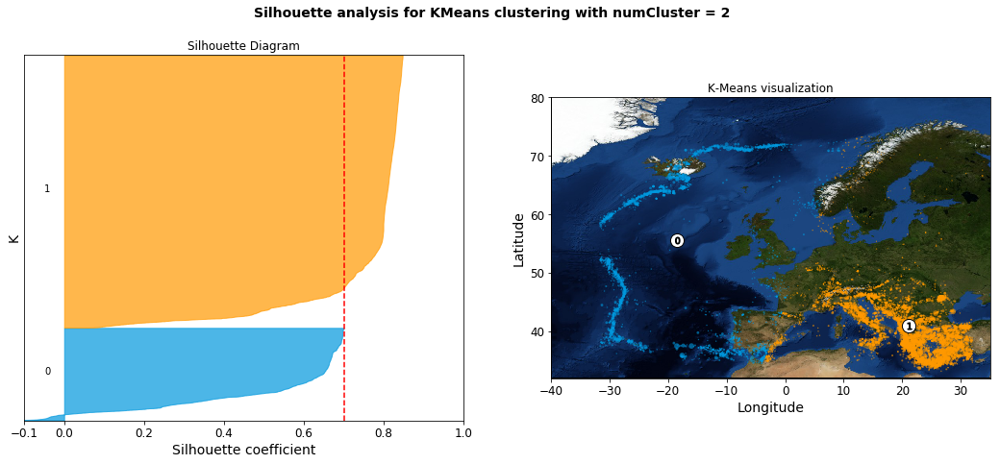

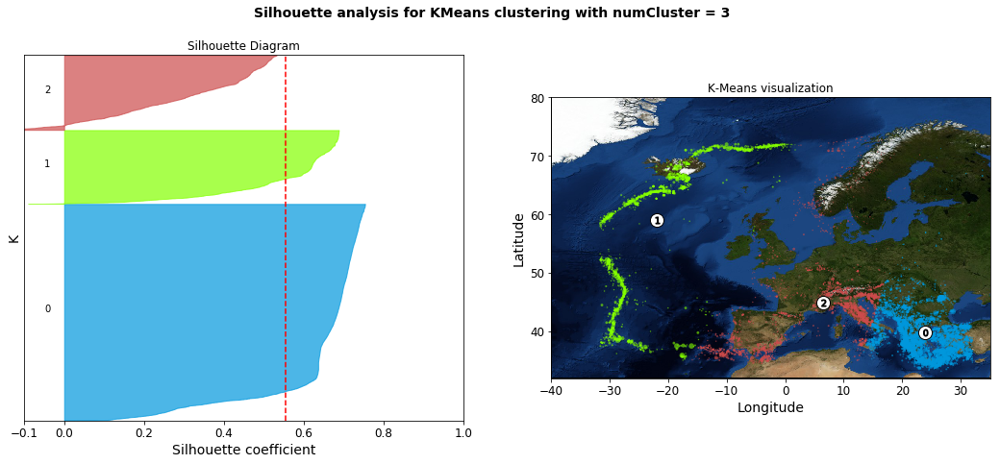

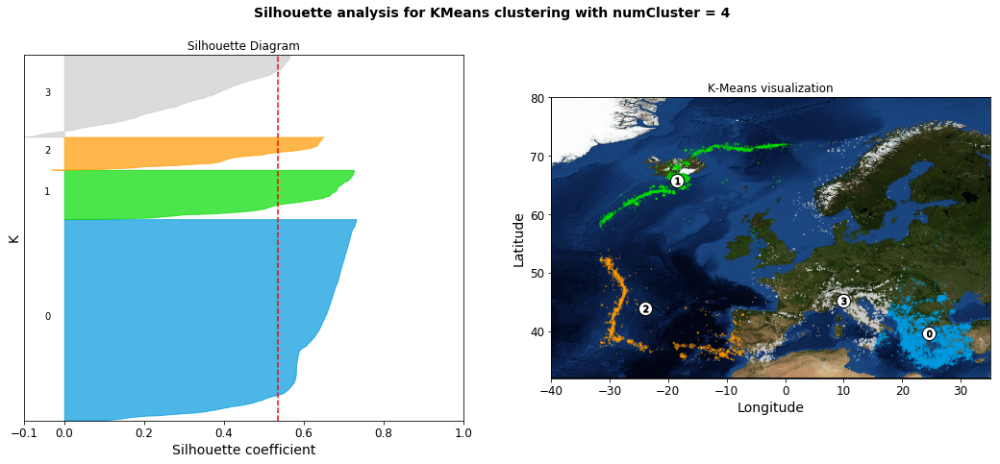

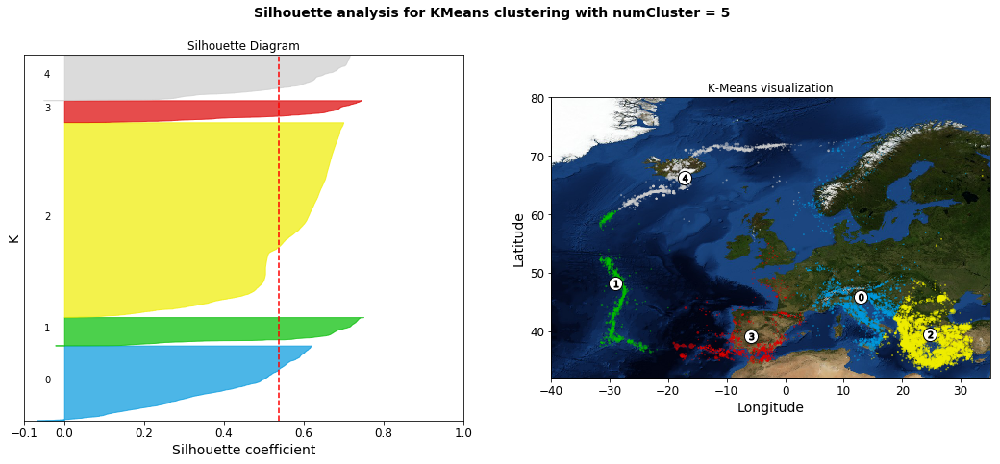

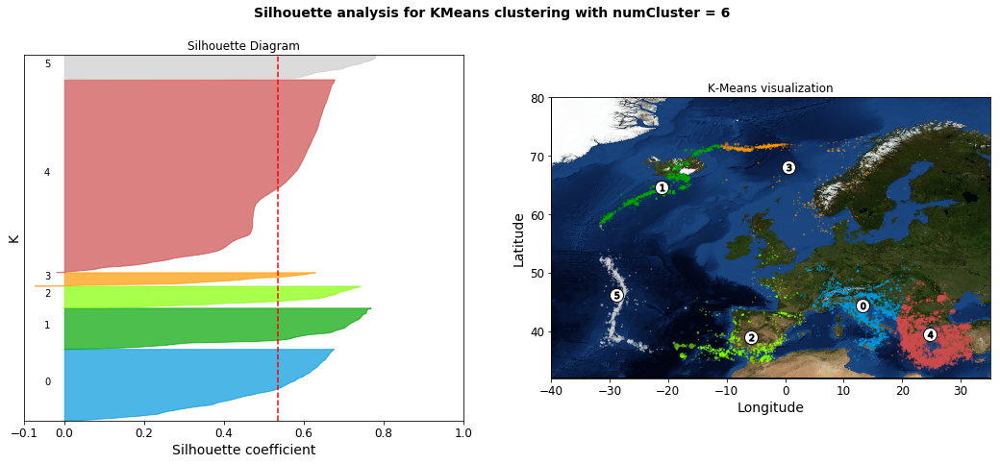

In [40]:
from sklearn.metrics import silhouette_samples
from matplotlib.ticker import FixedLocator, FixedFormatter
import matplotlib.cm as cm

plt.figure(figsize=(11, 9))


numCluster = [2, 3, 4, 5, 6]
for n_clusters in numCluster:
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(coordinates) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 42 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=42) #default init='kmeans++'
    cluster_labels = clusterer.fit_predict(coordinates)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(coordinates, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(coordinates, cluster_labels)

    y_lower = 10 #coordinata y di partenza della barra del cluster nel silhouette diagram
    for i in range(n_clusters):
        cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        cluster_silhouette_values.sort()

        size_cluster_i = cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters + 0.3)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("Silhouette Diagram")
    ax1.set_xlabel("Silhouette coefficient")
    ax1.set_ylabel("K")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters + 0.3)
    
    plt.imshow(europa_img, extent=[-40, 35, 32, 80], alpha=1)
    ax2.scatter(coordinates[:, 0], coordinates[:, 1], marker='.', s=np.array(size()), lw=0, alpha=0.6,
                c=colors, edgecolor='k')

    # Etichette cluster
    centers = clusterer.cluster_centers_
    # Centro dei cluster
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("K-Means visualization")
    ax2.set_xlabel("Longitude")
    ax2.set_ylabel("Latitude")

    plt.suptitle(("Silhouette analysis for KMeans clustering "
                  "with numCluster = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

La retta rossa tratteggiata nei *silhouette diagram* rappresenta la media del **silhouette score** raggiunto con un determinato numero k di cluster.

L'osservazione di questo tipo di diagramma ci fa capire che se per un determinato cluster, il suo silhouette coefficient non raggiunge questa media, allora il numero di cluster scelto non è adatto.
_____
Nel mio caso di studio solo con k=3 il cluster 2 non raggiunge questa media, perciò non è una buona scelta.

Seguendo la previsione fatta con *Elbow Method* e con il *Silhouette Coefficient*, il numero ottimale di cluster è pari a 2. Noto però che la *size* del cluster 1 è molto più grande rispetto al cluster 0; questo perchè il cluster 1 è  quel cluster che comprende le zone di Grecia, Italia e del resto delle zone terrestri europee, dove vi sono stati registrati un numero molto maggiore di terremoti.
Potenzialmente il cluster 1 potrebbe dividersi in 3 sub-cluster.

Infatti, osservando le altre stime fatte tramite il *Silhouette Diagram*, noto che con k=5 ottengo un buon clustering, con **mean silhouette score = ~0,64**:
- Le zone terrestri sono state divise in 3 sub-cluster che, approssimativamente, corrispondono alle zone di Grecia, Italia e Spagna.
- Le zone marine sono state divise anche esse in 2 sub-cluster.

Anche con k=5 è presente il cluster 2 che ha la size maggiore rispetto agli altri, questo perchè la densità di terremoti registrati in Europa Sud-Orientale è molto maggiore rispetto le altre zone coperte da altri cluster.

Saving figure k-means_map_clustering


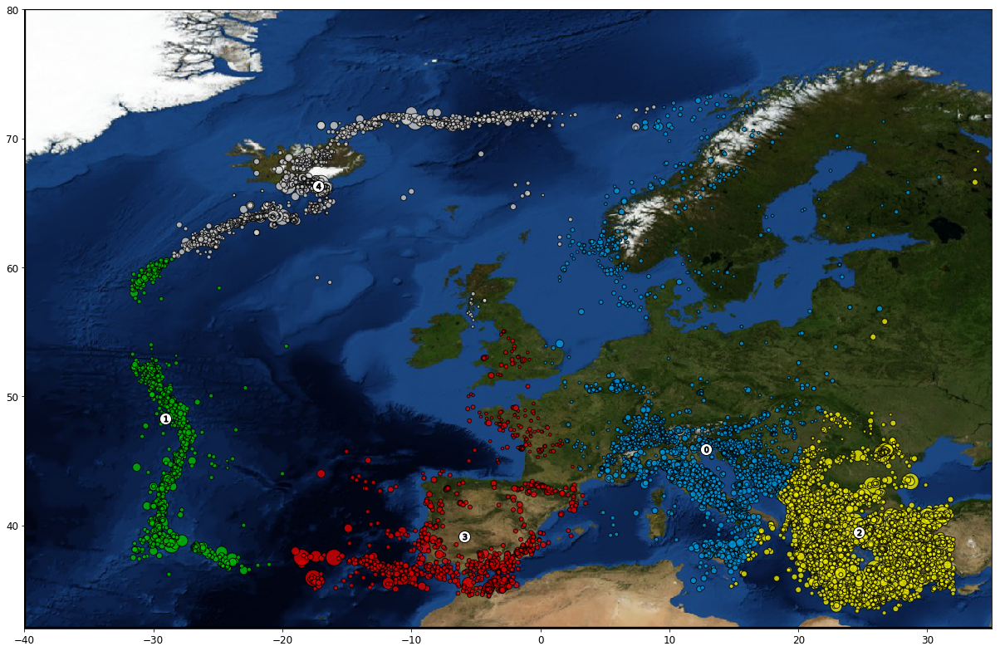

In [41]:
plt.figure(figsize=(22,11))

clusterer = KMeans(n_clusters=5, random_state=42)
cluster_labels = clusterer.fit_predict(coordinates)

colors = cm.nipy_spectral(cluster_labels.astype(float) / 5 + 0.3) # 0.3 coefficiente per evitare il colore nero

plt.imshow(europa_img, extent=[-40, 35, 32, 80], alpha=1)
plt.scatter(coordinates[:, 0], coordinates[:, 1], s=np.multiply(np.array(size()),[3]), edgecolor='k', alpha=0.8, c=colors)

# Etichette cluster
centers = clusterer.cluster_centers_
# Centro dei cluster
plt.scatter(centers[:, 0], centers[:, 1], marker='o',
            c="white", alpha=1, s=200, edgecolor='k')

for i, c in enumerate(centers):
    plt.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                s=50, edgecolor='k')
save_fig('k-means_map_clustering')
plt.show()


In realtà nel codice precedentemente eseguito ho sempre inizializzato il metodo di clustering **K-MEANS++**.

Infatti se al momento dell'inizializzazione di KMeans() non viene specificato il valore di *init*, il valore di default è: "*init='kmeans++'*".
Se non volessi usare K-Means++ ma usare  K-Means classico dovrei specificare: "*init='random'*"

### K-Means++
E' molto simile al *K-Means* classico, cambia solo la parte iniziale dell'algoritmo.
1. Viene scelto un centroide uniformemente in maniera random dal dataset
2. Per ogni punto $x$ viene calcolato $D(x)$, cioè la distanza tra $x$ e il centroide più vicino che è già stato scelto.
- Viene scelto un nuovo centroide in maniera random del dataset, usando una distribuzione di probabilità pesata affinchè il punto $x$ sia scelto con probabilità proporzionale a $D(x)^2$.
- Vengono ripetuti gli *Step 2 e 3* fin quando non sono stati scelti *K centroidi*.
- Quindi una volta che sono stati scelti i k centroidi procede con il K-Means classico.

## DBSCAN
E' un algoritmo *Density-Based*.

Per **Densità** si intende il numero di punti all'interno di un raggio specifico. I punti vengono classificati in: *core point, border point e noise point.*

- **Core point**: se ha <font color=red>almeno</font> un numero **MinPts** di punti all'interno del raggio( di lunghezza **Eps**). Questi punti sono all'interno del cluster.
- **Border point**: non è un *core point*, però fa parte dei "vicini" di un *core point*.
- **Noise point**: qualsiasi altro punto che non sia nè *core point* nè *border point*. I *noise point* vengono eliminati.

<img src="images/dbscan_points" title="DBSCAN points" />



DBSCAN è in grado di rilevare autonomamente gli outliers e inoltre riesce a catturare cluster di diversa forma e dimensione; ha però anche dei difetti, infatti non lavora bene con rappresentazioni di punti a densità variabile e con dataset di grandi dimensioni. 

Un punto cruciale in ogni lavoro di Data Mining è la scelta dei giusti parametri da passare. DBSCAN, a differenza di K-Means, non richiede di passare in input il numero di cluster che si vogliono ottenere. Infatti è in grado di ricavare il numero di cluster in maniera autonoma.

DBSCAN richiede in input 2 parametri: *eps e MinPts*. Per la scelta del valore corretto di questi 2 parametri bisogna conoscere le proprietà del dataset che si sta analizzando.
- eps: scegliendo un valore di epsylon troppo piccolo, la maggior parte dei punti del dataset non verranno clusterizzati ma verranno considerati come degli outliers in quanto non fanno parte di una regione abbastanza *densa*. Il valore di *eps* si può scegliere basandosi sul grafico delle distanze, ordinate in senso crescente, risultanti da un KNN con k = MinPts.
- MinPts: come regola generale il numero di *MinPts* deve essere maggiore del numero di colonne del dataset. Valori maggiori di *MinPts* sono migliori nei dataset con molto rumore; il valore minimo di *MinPts* è $3$, ma più il dataset è grande più un valore di *MinPts* maggiore dà risultati migliori.

Generalmente per la scelta del valore *eps* viene scelto *MinPts=4*.

Dopo numerosi esperimenti ho deciso di moltiplicare di un fattore $10$ il valore di *MinPts* anche perchè le distanze nel plot della mappa sono nell'ordine di $10^1$.
Osservando il grafico delle distanze di KNN con $K=40$, noto che in corrispondenza di $y=2$ il grafico assume una forma *'a gomito'*. Concludo che il valore di *eps* debba essere pari a 2.

Saving figure knn_distance_DBSCAN


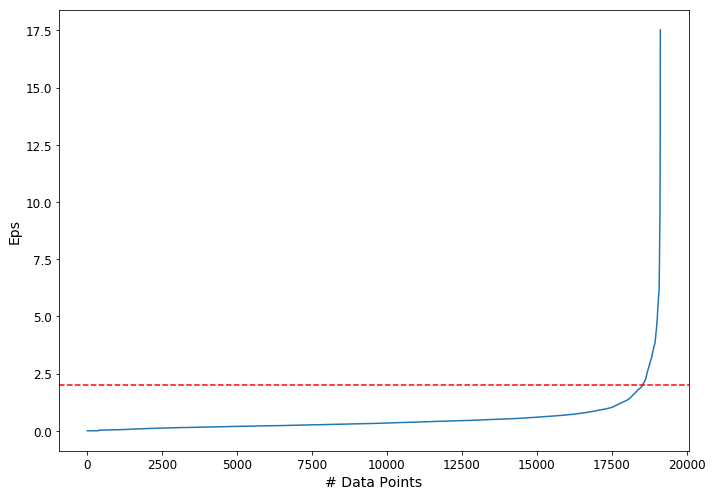

In [42]:
from sklearn.neighbors import NearestNeighbors

ns = 40
nbrs = NearestNeighbors(n_neighbors=ns).fit(coordinates)
distances, indices = nbrs.kneighbors(coordinates)
distanceDec = sorted(distances[:,ns-1], reverse=False)
plt.figure(figsize=(10,7))
plt.plot(list(range(1,19126+1)), distanceDec)
plt.ylabel('Eps')
plt.xlabel('# Data Points')
plt.axhline(y=2, color="red", linestyle="--")
save_fig("knn_distance_DBSCAN")

Saving figure dbscan_map_clustering_process


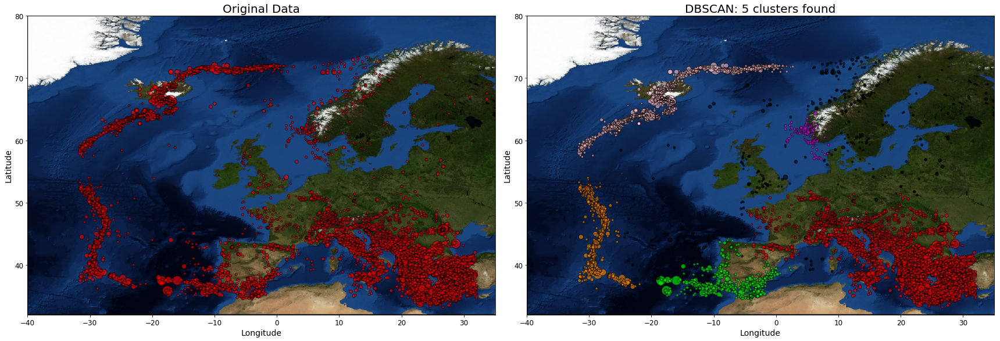

In [43]:
from sklearn.cluster import DBSCAN

def color(labels,colors):
    lista=[]
    for k in labels:
        if k == -1:
        # Black used for noise.
            lista.append('k')
        else:
            lista.append(colors[k])
    return lista



max_distance = 2
dbscan = DBSCAN(eps=max_distance, min_samples=37).fit(coordinates) 

# Extract labels (-1 is used for outliers)
labels = dbscan.labels_
n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
unique_labels = set(labels)

colors2=['r','lime','fuchsia','pink','darkorange','k']

fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(24, 13)

ax1.imshow(europa_img, extent=[-40, 35, 32, 80], alpha=1)
ax1.scatter(coordinates[:,0], coordinates[:,1], s=np.multiply(np.array(size()),[2]) , edgecolor='k', alpha=0.6, c='r')
ax1.set_title('Original Data', fontsize = 20)
ax1.set_ylabel("Latitude", fontsize=14)
ax1.set_xlabel("Longitude", fontsize=14)
ax2.imshow(europa_img, extent=[-40, 35, 32, 80], alpha=1)
ax2.scatter(coordinates[:,0], coordinates[:,1], s=np.multiply(np.array(size()),[2]), edgecolor='k', alpha=0.6, c=color(labels,colors2))
ax2.set_title('DBSCAN: %d clusters found' % n_clusters, fontsize = 20)
ax2.set_ylabel("Latitude", fontsize=14)
ax2.set_xlabel("Longitude", fontsize=14)
save_fig('dbscan_map_clustering_process')

## Questo è il risultato finale del clustering offerto da DBSCAN

Saving figure dbscan_map_clustering


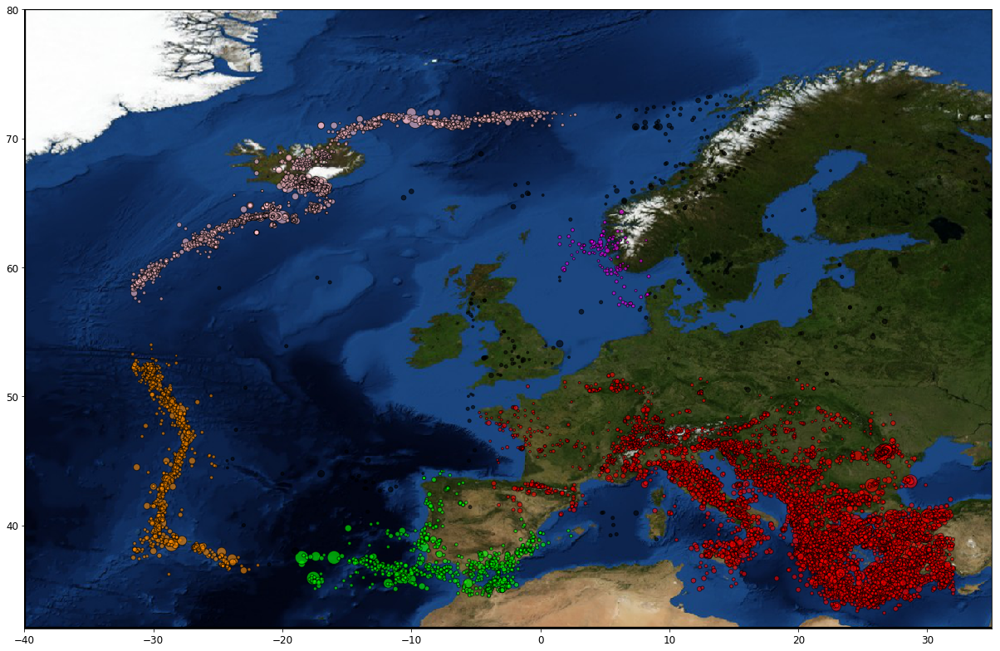

In [44]:
plt.figure(figsize=(22,11))
plt.imshow(europa_img, extent=[-40, 35, 32, 80], alpha=1)
plt.scatter(coordinates[:,0], coordinates[:,1], s=np.multiply(np.array(size()),[2]), edgecolor='k', alpha=0.6, c=color(labels,colors2))
save_fig('dbscan_map_clustering')

DBSCAN, a differenza di K-Means, ha la proprietà di catturare autonomamente gli outliers. Penso, per esempio, alle scosse verificatosi in Nord-Europa, in Inghilterra e in mare tra la Sardegna e le Isole Baleari; infatti la densità di eventi sismici registrati in queste zone è molto minore rispetto al resto d'Europa.

Noto che, a parte il piccolo cluster nei pressi dela Norvegia, i cluster ricavati da DBSCAN sono molto simili a quelli ottenuti da K-Means con una sola differenza:
le scosse registrate nei pressi di Italia e Grecia fanno parte dello stesso cluster, mentre con K-Means riuscivo a dividere le due nazioni.

Questo è dovuto al fatto che DBSCAN è un algoritmo Density-Based e la densità di eventi sismici registrati in quelle zone è molto alta tanto da non riuscire ad ottenere cluster diversi per rappresentare Italia e Grecia.

L'algoritmo di clustering DBSCAN mi ha permesso di catturare in maniera semplice gli outliers del dataset. Arrivato a questo punto posso ripetere l'algoritmo K-Means per ottenere un clustering più preciso.

Infatti K-Means è molto sensibile agli outliers; nonostante ciò, il risultato ottenuto dalla prima esecuzione di K-Means risulta accettabile, ma applicando l'algoritmo nuovamente sul dataset pulito dagli outliers dovrei ottenere un clustering più preciso.

In [45]:
pd.Series(dbscan.labels_).value_counts()

 0    14028
 3     2545
 4     1240
 1      886
-1      303
 2      124
dtype: int64

Da questa operazione noto che il numero di outliers è pari a 303 e devono essere eliminati. Un altro aspetto interessante è che il cluster identificato da id=2 ha un numero di punti pari a 124, quindi di dimensione molto minore rispetto al resto d'europa.
Dato che la dimensione di quest'ultimo cluster è molto più piccolo rispetto agli altri decido di non considerarli nel dataset finale.

In [46]:
core_samples_mask = np.zeros_like(dbscan.labels_, dtype=bool) #crea un array di tutti False (perchè dtype=bool) della stessa lunghezza di dbscan.labels_
core_samples_mask[dbscan.core_sample_indices_] = True #mette a True gli elementi in posizione dei core point
for i in dbscan.core_sample_indices_:
    if dbscan.labels_[i]==2:
        core_samples_mask[i]=False

Saving figure k-means_map_clustering_without_outliers


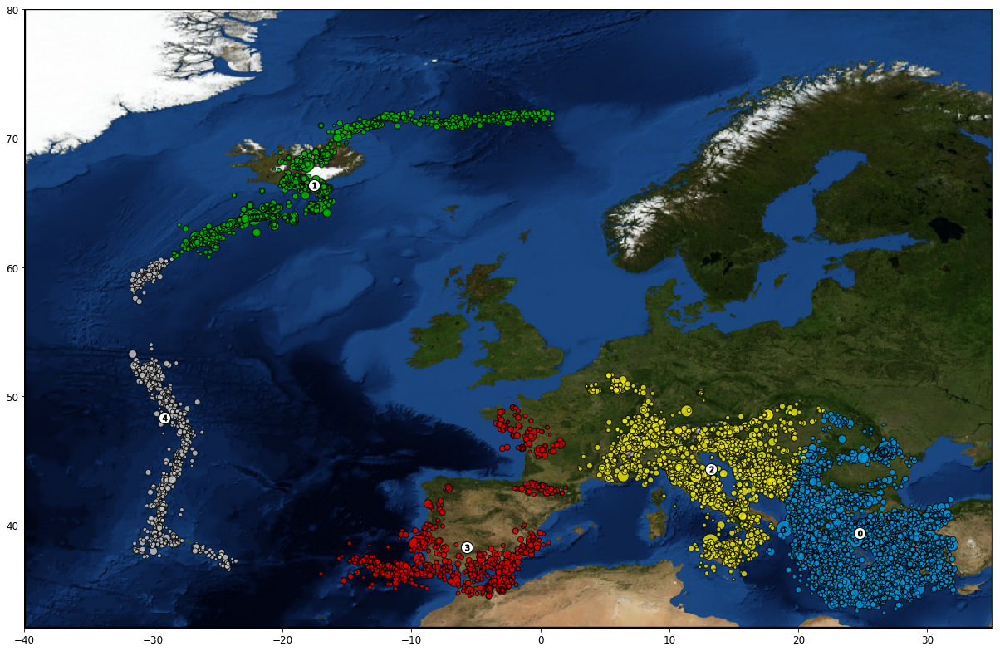

In [47]:
dataWithoutNoise = coordinates[core_samples_mask]

plt.figure(figsize=(22,11))
plt.imshow(europa_img, extent=[-40, 35, 32, 80], alpha=1)
clustererFinal = KMeans(n_clusters=5, random_state=42)
cluster_labels_final = clustererFinal.fit_predict(dataWithoutNoise)

colorsFinal = cm.nipy_spectral(cluster_labels_final.astype(float) / 5 + 0.3)
plt.scatter(dataWithoutNoise[:, 0], dataWithoutNoise[:, 1], s=np.multiply(np.array(size()),[3]), edgecolor='k', alpha=0.8, c=colorsFinal)

# Etichette cluster
centersFinal = clustererFinal.cluster_centers_
# Centro dei cluster
plt.scatter(centersFinal[:, 0], centersFinal[:, 1], marker='o',
            c="white", alpha=1, s=200, edgecolor='k')

for i, c in enumerate(centersFinal):
    plt.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                s=50, edgecolor='k')
save_fig('k-means_map_clustering_without_outliers')
plt.show()

Saving figure dbscan_vs_kmeans


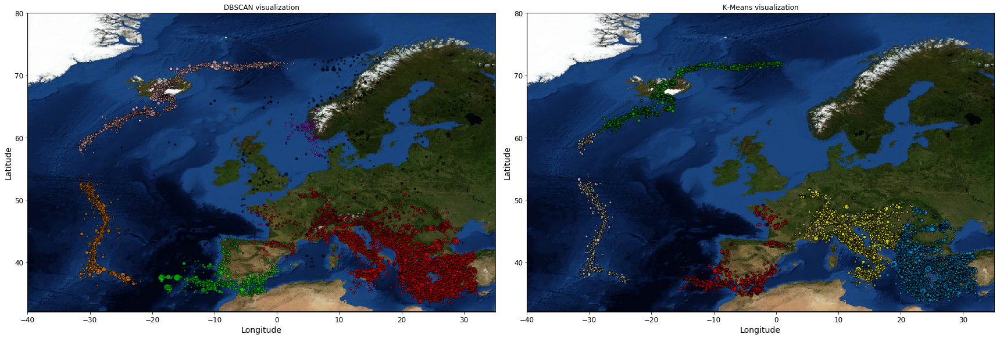

In [48]:
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(24, 13)
ax1.imshow(europa_img, extent=[-40, 35, 32, 80], alpha=1)
ax1.scatter(coordinates[:,0], coordinates[:,1], s=np.multiply(np.array(size()),[1]), edgecolor='k', alpha=0.6, c=color(labels,colors2))
ax1.set_title("DBSCAN visualization")
ax1.set_xlabel("Longitude")
ax1.set_ylabel("Latitude")
ax2.imshow(europa_img, extent=[-40, 35, 32, 80], alpha=1)
ax2.scatter(dataWithoutNoise[:, 0], dataWithoutNoise[:, 1], s=np.multiply(np.array(size()),[1]), edgecolor='k', alpha=0.8, c=colorsFinal)
ax2.set_title("K-Means visualization")
ax2.set_xlabel("Longitude")
ax2.set_ylabel("Latitude")
save_fig("dbscan_vs_kmeans")

Queste sono le versioni finali del clustering ottenute da DBSCAN e K-Means. Ognuna delle due rappresentazioni ha pro e contro:
- In DBSCAN riesco a separare correttamente le due concentrazioni di eventi sismici verificatosi in mare (che corrispondono al perimetro della placca *eurasiatica*, non riesco però ad ottenere una netta separazione tra la penisola balcanica e la penisola italiana.
- In K-Means (soprattutto dopo l'eliminazione degli outliers) riesco a separare penisola balcanica e italiana, ma non riesco ad ottenere una separazione netta degli eventi sismici nell'oceano atlantico.

Nonostante ciò, preferisco la clusterizzazione ottenuta da K-Means perchè riesce ad assegnare terremoti della penisola italiana e di quella balcanica a cluster diversi. Nel dettaglio, con K-Means riesco ad ottenere 5 cluster che ben sintetizzano le zone europee, infatti ottengo:
- un cluster per le zone del sud-est dell'Europa (penisola balcanica)
- un cluster per le zone del centro-sud dell'Europa (penisola italiana)
- un cluster per le zone del sud-ovest dell'Europa (penisola iberica)
- due cluster che contengono gli eventi sismici verificatosi nel perimetro della *placca eurasiatica*

Nella rappresentazione del K-Means ho deciso di non comprendere i terremoti verificatosi in Norvegia (quelli che in DBSCAN sono di colore viola) poichè la densità di questi terremoti è molto minore rispetto alle densità registrate nel resto d'Europa.

Applicando K-Means una seconda volta, dopo aver pulito il dataset dagli outliers, mi ha permesso di ottenere una clusterizzazione più precisa. 

Lo noto anche dal fatto che nella seconda esecuzione di K-Means gli eventi sismici verificatosi in Calabria risultano  tutti fare parte del cluster della penisola italiana; mentre nella prima esecuzione di K-Means, i terremoti della Calabria Jonica facevano parte del cluster della penisola balcanica.

Saving figure confronto_esecuzioni_k-means


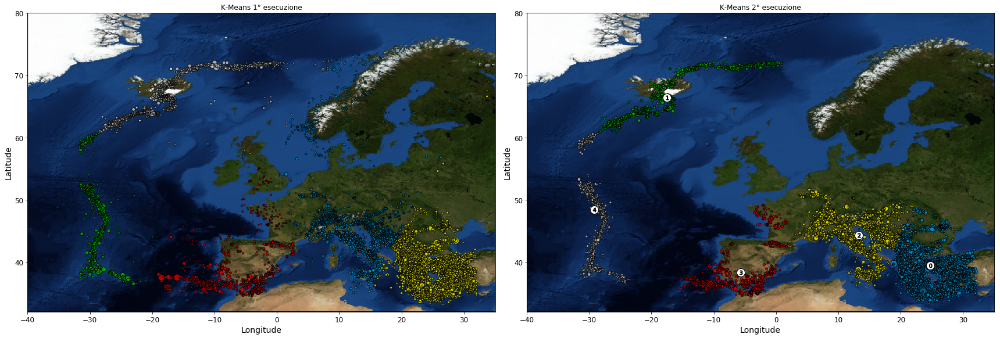

In [49]:
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(24, 13)
ax1.imshow(europa_img, extent=[-40, 35, 32, 80], alpha=1)
ax1.scatter(coordinates[:,0], coordinates[:,1], s=np.multiply(np.array(size()),[1]), edgecolor='k', alpha=0.8, c=colors)
ax1.set_title("K-Means 1° esecuzione")
ax1.set_xlabel("Longitude")
ax1.set_ylabel("Latitude")
ax2.imshow(europa_img, extent=[-40, 35, 32, 80], alpha=1)
ax2.scatter(dataWithoutNoise[:, 0], dataWithoutNoise[:, 1], s=np.multiply(np.array(size()),[1]), edgecolor='k', alpha=0.8, c=colorsFinal)

ax2.scatter(centersFinal[:, 0], centersFinal[:, 1], marker='o',
            c="white", alpha=1, s=200, edgecolor='k')

for i, c in enumerate(centersFinal):
    ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                s=50, edgecolor='k')
    
ax2.set_title("K-Means 2° esecuzione")
ax2.set_xlabel("Longitude")
ax2.set_ylabel("Latitude")
save_fig("confronto_esecuzioni_k-means")

# II Parte

## Un'idea molto interessante sarebbe quella di allenare un modello che, sulla base della conoscenza del dataset SHEEC, sia in grado di restituirmi la probabilità che si verifichi un terremoto in una specifica area geografica.

### Procedo con la preparazione del dataset in maniera tale da poter allenare nel migliore dei modi il modello.

In [50]:
#Assegno ai punti di Noise una probabilità di verifica del terremoto pari a 0
data['prob (%)']=0
data.loc[core_samples_mask, 'prob (%)']= 100
data[51:60]

,y,mo,d,h,min,sec,lat,lon,Mw,depth,prob (%)
51,1901,3,5,16.0,50.0,-1.0,45.10,19.60,3.7,10.0,100
52,1901,3,8,5.0,43.0,-1.0,61.80,3.00,4.3,48.0,0
53,1901,3,22,19.0,33.0,52.0,45.94,14.73,4.1,19.0,100
54,1901,3,29,7.0,5.0,-1.0,45.17,7.17,4.6,16.0,100
55,1901,3,30,13.0,40.0,-1.0,44.30,22.10,4.1,20.0,100
56,1901,3,31,7.0,10.0,24.0,43.40,28.70,7.2,14.0,0
57,1901,3,31,11.0,30.0,-1.0,43.60,28.70,5.0,30.0,0
58,1901,4,2,16.0,54.0,30.0,45.50,20.70,5.0,18.0,100
59,1901,4,2,18.0,15.0,-1.0,45.57,20.72,3.7,10.0,100


In [51]:
noisePoint = data[data['prob (%)']==0]
noisePoint.head()

,y,mo,d,h,min,sec,lat,lon,Mw,depth,prob (%)
38,1901,1,10,2.0,30.0,-1.0,50.5,16.1,5.1,15.0,0
52,1901,3,8,5.0,43.0,-1.0,61.8,3.0,4.3,48.0,0
56,1901,3,31,7.0,10.0,24.0,43.4,28.7,7.2,14.0,0
57,1901,3,31,11.0,30.0,-1.0,43.6,28.7,5.0,30.0,0
64,1901,4,25,22.0,25.0,-1.0,43.4,28.5,5.0,10.0,0


Sto contanto i neighbor dei noise point.
Infatti la probabilità di un evento sismico di un punto appartenente ad un cluster è pari al 100%, invece i noise point sono delle rappresentazioni isolate di eventi sismici. L'obiettivo è quello di dare un valore percentuale della possibile verifica di un evento sismico in prossimità di un noise point. La speranza è che, una volta addestrato, il modello mi dia la percentuale di verifica di un terremoto di una qualsiasi zona europea. 

In [52]:
#Sto contanto il numero di neighbor rispetto ad un punto passato in input. Per capire qual è la percentuale di avvenimento di un
#terremoto da parte dei noise point. Applico il learning di kdtree su ogni punto della struttura che contiene i noise point
#per capire quanti eventi sismici sono avvenuti nelle vicinanze
import scipy.spatial as spatial
noisePointMatrix = noisePoint.as_matrix(columns=noisePoint.columns[6:8])
neighbor = spatial.KDTree(coordinates) #la alleno su tutti i punti del dataset
index = noisePoint.index
i = 0
data2 = data
for x,y in noisePointMatrix:
    tmp = neighbor.data[neighbor.query_ball_point(np.array([y,x]), 3)].size/2
    noisePoint.loc[index[i],'# neighbor'] = tmp
    i+=1
data = data2
noisePoint.head()


,y,mo,d,h,min,sec,lat,lon,Mw,depth,prob (%),# neighbor
38,1901,1,10,2.0,30.0,-1.0,50.5,16.1,5.1,15.0,0,64.0
52,1901,3,8,5.0,43.0,-1.0,61.8,3.0,4.3,48.0,0,75.0
56,1901,3,31,7.0,10.0,24.0,43.4,28.7,7.2,14.0,0,312.0
57,1901,3,31,11.0,30.0,-1.0,43.6,28.7,5.0,30.0,0,1230.0
64,1901,4,25,22.0,25.0,-1.0,43.4,28.5,5.0,10.0,0,1284.0


In [53]:
neighborCol = noisePoint['# neighbor']
neighborCol = neighborCol.dropna(axis=0)
neighborCol.describe()

count     640.000000
mean       81.515625
std       208.738404
min         1.000000
25%        21.000000
50%        38.000000
75%        80.250000
max      1609.000000
Name: # neighbor, dtype: float64

Visti i risultati ottenuti noto che il 25 percentile dei neighbor di ogni noise point è pari a 21, il 50 % è pari a 38, il 75% è pari ad 80.
Sulla base di queste considerazioni, decido di considerare zone ad alto rischio sismico (cioè con una probabilità pari al 100%), tutte quelle zone che ergistrano un numero di neighbor >= 160.

Normalizzo sulla base di questo rapporto: $$x:160=y:100$$ => $$y= \frac{(100*x)}{160}$$

In [54]:
normalize = lambda x : np.where(x<=160, (100*x)/160, 100)
neighborCol = neighborCol.apply(normalize)
noisePoint['# neighbor'] = neighborCol

noisePoint.head()

,y,mo,d,h,min,sec,lat,lon,Mw,depth,prob (%),# neighbor
38,1901,1,10,2.0,30.0,-1.0,50.5,16.1,5.1,15.0,0,40.000
52,1901,3,8,5.0,43.0,-1.0,61.8,3.0,4.3,48.0,0,46.875
56,1901,3,31,7.0,10.0,24.0,43.4,28.7,7.2,14.0,0,100.000
57,1901,3,31,11.0,30.0,-1.0,43.6,28.7,5.0,30.0,0,100.000
64,1901,4,25,22.0,25.0,-1.0,43.4,28.5,5.0,10.0,0,100.000


Arrivato a questo punto faccio il merge delle colonne *'prob (%)'* e *'# neighbor'*

In [55]:
index = neighborCol.index
i = 0
data2 = noisePoint
for x in neighborCol:
    data2.loc[index[i],'prob (%)'] = x
    i+=1
noisePoint = data2
noisePoint.head()


,y,mo,d,h,min,sec,lat,lon,Mw,depth,prob (%),# neighbor
38,1901,1,10,2.0,30.0,-1.0,50.5,16.1,5.1,15.0,40.000,40.000
52,1901,3,8,5.0,43.0,-1.0,61.8,3.0,4.3,48.0,46.875,46.875
56,1901,3,31,7.0,10.0,24.0,43.4,28.7,7.2,14.0,100.000,100.000
57,1901,3,31,11.0,30.0,-1.0,43.6,28.7,5.0,30.0,100.000,100.000
64,1901,4,25,22.0,25.0,-1.0,43.4,28.5,5.0,10.0,100.000,100.000


Quindi elimino la colonna *'# neighbor'*

In [56]:
noisePoint = noisePoint.drop(columns=['# neighbor'])

In [57]:
noisePoint['prob (%)']= noisePoint['prob (%)'].astype(int)
# df.a = df.a.astype(float)
noisePoint.head()

,y,mo,d,h,min,sec,lat,lon,Mw,depth,prob (%)
38,1901,1,10,2.0,30.0,-1.0,50.5,16.1,5.1,15.0,40
52,1901,3,8,5.0,43.0,-1.0,61.8,3.0,4.3,48.0,46
56,1901,3,31,7.0,10.0,24.0,43.4,28.7,7.2,14.0,100
57,1901,3,31,11.0,30.0,-1.0,43.6,28.7,5.0,30.0,100
64,1901,4,25,22.0,25.0,-1.0,43.4,28.5,5.0,10.0,100


In [58]:
index = neighborCol.index
i = 0
data2 = data
for x in neighborCol:
    data2.loc[index[i],'prob (%)'] = x
    i+=1
data2['prob (%)'] = data2['prob (%)'].astype(int)
data = data2
data[89:102]

,y,mo,d,h,min,sec,lat,lon,Mw,depth,prob (%)
89,1901,9,18,1.0,24.0,-1.0,57.43,-4.32,4.6,11.0,11
90,1901,9,18,3.0,56.0,-1.0,57.43,-4.32,4.1,16.0,11
91,1901,9,22,21.0,42.0,12.0,43.62,10.95,4.8,16.0,100
92,1901,9,23,18.0,11.0,-1.0,45.70,26.60,5.7,130.0,100
93,1901,9,25,23.0,40.0,-1.0,43.83,13.00,4.6,16.0,100
94,1901,10,7,21.0,4.0,-1.0,42.40,18.70,4.2,16.0,100
95,1901,10,15,13.0,55.0,53.0,42.23,13.98,4.8,16.0,100
96,1901,10,25,16.0,18.0,30.0,37.00,22.20,5.3,20.0,100
97,1901,10,26,20.0,30.0,-1.0,45.97,15.17,4.1,16.0,100
98,1901,10,27,20.0,11.0,40.0,44.00,19.50,4.9,16.0,100


------
# Problema di Regressione o Classificazione?
Dopo aver affrontato nella I fase un problema di *Clustering*, voglio adesso ottenere una predizione della sismicità di una specificata area geografica. Le predizioni si possono ricavare tramite tecniche di *Classificazione* o di *Regressione*.
- Classificazione: gli input sono divisi in due o più classi e il sistema di apprendimento deve produrre un modello in grado di assegnare ad un input una delle classi tra quelle disponibili. Questi tipi di task sono tipicamente affrontati mediante tecniche di apprendimento supervisionato.
- Regressione: è concettualmente simile alla classificazione, con la differenza che l’output ha un dominio continuo e non discreto. Anch’essa è tipicamente affrontata con l’apprendimento supervisionato. L'output prodotto non è un valore 'categorico', ma è un valore numerico specifico (potenzialmente un numero illimitato).

L'obiettivo di questo lavoro è quello di restituire il valore percentuale della possibile verifica di un evento sismico in corrispondenza di una specifica area geografica, di conseguenza è facile intuire che si tratta di un problema di *Regressione* poichè il valore da restituire è un valore continuo e non discreto.

----------
## Modello di Regressione
Separo il dataset in maniera tale da avere le colonne in input (X) e la colonna di output (y).
X sarà pari alle colonne 'lat' e 'lon' del dataset, mentre 'y' sarà naturalmente la colonna 'prob (%)'.

In [59]:
#separo il dataset considerando solo le colonne 'lat' e 'lon', questo sarà X, mentre l'intera colonna 'prob (%)' sarà y (cioè il dataset target)

X = data[['lat','lon']]
y = data['prob (%)']

Adesso seleziono un parte del dataset che procederà al training del modello, e la restante parte farà da test del modello.

In [60]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)#, stratify = y)# regression

----

### Per allenare il modello esistono numerose tecniche; è importante, però, scegliere quella che garantisce il risultato migliore. Per fare questo esistono delle *metriche* che definiscono la *'Evaluation'* del nostro modello.

## Regression Model Evaluation
Le metriche maggiormente usate sono quelle delle *Mean Absolute Error* (MAE), *Mean Squared Error* (MSE) (o la radice di questa denominata *Root Mean Squared Error* (RMSE)) o *Mean Absolute Percentage Error* (MAPE).
- $${MAE}(y, \hat{y}) = \frac{1}{n_{\text{samples}}} \sum_{i=0}^{n_{\text{samples}}-1} \left| y_i - \hat{y}_i \right|$$
- $${MSE}(y, \hat{y}) = \frac{1}{n_{\text{samples}}} \sum_{i=0}^{n_{\text{samples}}-1} \left( y_i - \hat{y}_i \right)^2$$
- $${MAPE}(y, \hat{y}) = \frac{100}{n_{\text{samples}}} \sum_{i=0}^{n_{\text{samples}}-1} \left|\frac{ y_i - \hat{y}_i}{y}\right|$$

MAE e MSE sono simili, solo che MSE eleva al quadrato gli scarti prima di sommarli tra loro, mentre MAE usa il valore assoluto degli scarti.
Di conseguenza il valore ottenuto da MSE sarà sempre maggiore rispetto al corrispondente MAE, per questo motivo le due metriche non sono comparabili tra loro.
In presenza di outlier il valore ottenuto da MSE si discosta di molto rispetto a quello ottenuto da MAE. Questo significa che, mentre MAE è robusto rispetto gli outlier, MSE dipende fortemente dagli outlier.
MAPE è l'equivalente in termini percentuali del MAE.

Nel dataset in esame, gli outlier assumono un'importanza significativa in quanto sono quei punti che non appartengono ai cluster e che hanno probabilità di verifica di un terremoto < 100%; per questo motivo voglio usare **MSE**, cioè una metrica che dipende fortemente dagli outlier e che, quindi, li tiene in considerazione.



## Model Selection
- Random Forest Regressor
- Decision Tree Regressor
- Bayesian Ridge
- Support Vector Regressor
- MLP Regressor
- K-Neighbors Regressor

----
### Random Forest Regressor

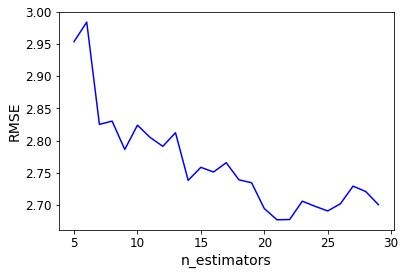

In [61]:
from sklearn.ensemble import RandomForestRegressor
from sklearn import metrics

lista=[]
for i in range (5,30):
    rF = RandomForestRegressor(n_estimators=i, random_state=0)
    rF.fit(X_train, y_train)
    y_pred = rF.predict(X_test)
    lista.append(np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
df = pd.DataFrame({'x': np.arange(5,30), 'y': lista })
plt.plot( 'x', 'y', data=df, color='blue')
plt.xlabel('n_estimators')
plt.ylabel('RMSE')
plt.show()

#### Scelgo il valore di n_estimators che mi garantisce un RMSE minore

In [62]:
rmse = min(lista)
#return il n_estimators relativo al minore rmse
i = df[df['y']==rmse]['x'].values[0]
#e quindi alleno di nuovo il modello
rF = RandomForestRegressor(n_estimators=i, random_state=0)
rF.fit(X_train, y_train)
y_pred = rF.predict(X_test)
print('[Random Forest] Root Mean Squared Error:', rmse)

[Random Forest] Root Mean Squared Error: 2.6767412577779024


--------
### Decision Tree Regressor

In [63]:
from sklearn.tree import DecisionTreeRegressor
decisionTreeR = DecisionTreeRegressor()
decisionTreeR.fit(X_train, y_train)
y_pred = decisionTreeR.predict(X_test)
rmse = np.sqrt(metrics.mean_squared_error(y_test, y_pred))
# decisionTreeR
print('[Decision Tree] Root Mean Squared Error:', rmse)

[Decision Tree] Root Mean Squared Error: 2.552685823549001


----
### Bayesian Ridge

In [64]:
from sklearn.linear_model import BayesianRidge
bayesR = BayesianRidge()
bayesR.fit(X_train, y_train)
y_pred = bayesR.predict(X_test)
rmse = np.sqrt(metrics.mean_squared_error(y_test, y_pred))
print('[Bayesian Ridge] Root Mean Squared Error:', rmse)

[Bayesian Ridge] Root Mean Squared Error: 12.54190057821431


---
### Support Vector Regressor

In [65]:
from sklearn.svm import SVR
svr = SVR()
svr.fit(X_train, y_train)
y_pred = svr.predict(X_test)
rmse = np.sqrt(metrics.mean_squared_error(y_test, y_pred))
print('[SVR] Root Mean Squared Error:', rmse)

[SVR] Root Mean Squared Error: 11.546915778274832


---
### K-Neighbors Regressor

In [66]:
from sklearn.neighbors import KNeighborsRegressor
knr = KNeighborsRegressor()
knr.fit(X_train, y_train)
y_pred = knr.predict(X_test)
rmse = np.sqrt(metrics.mean_squared_error(y_test, y_pred))
print('[K-neighbors Regressor] Root Mean Squared Error:', rmse)

[K-neighbors Regressor] Root Mean Squared Error: 2.9772424855164275


----
### MLP Regressor

In [67]:
from sklearn.neural_network import MLPRegressor
mlp = MLPRegressor()
mlp.fit(X_train, y_train)
y_pred = mlp.predict(X_test)
rmse = np.sqrt(metrics.mean_squared_error(y_test, y_pred))
print('[MLP] Root Mean Squared Error:', rmse)

[MLP] Root Mean Squared Error: 10.401005247593076


---
## Scelta del modello migliore
### Analizzando i valori RMSE registrati dai modelli allenati e dopo numerosi tentativi, il modello migliore risulta essere Random Forest Regressor.

### Noto che oltre al Random Forest ottengono delle buone performance anche K-Neighbor Regressor e Decision Tree Regressor, per questo motivo decido di salvare questi 3 modelli in memoria per poterli poi usare in futuro senza la necessità di doverli allenare nuovamente

In [68]:
from joblib import dump, load
dump(rF, 'model/randomForest.joblib') 
dump(decisionTreeR, 'model/decisionTreeR.joblib') 
dump(knr, 'model/kNeighborsR.joblib')

['model/kNeighborsR.joblib']

#### Segue l'implementazione di una GUI che permette l'utilizzo del modello allenato.

In [69]:
from tkinter import *
from tkinter.filedialog import *
from PIL import Image, ImageTk
import pandas as pd


#Carico da memoria i 3 modelli con le performance migliori, senza eseguire tutto il notebook
rF2 = load('model/randomForest.joblib')
decisionTreeR2 = load('model/decisionTreeR.joblib')
knr2 = load('model/kNeighborsR.joblib')

if __name__ == "__main__":
    root = Tk()
    root.title("European Earthquake Analysis")
    root.resizable(False, False)
    
    frame = Frame(root, bd=2, relief=SUNKEN)
    frame.grid_rowconfigure(0, weight=1)
    frame.grid_columnconfigure(0, weight=1)
    canvas = Canvas(frame, width=800, height=500, bd=0)
    canvas.grid(row=0, column=0, sticky=N+S+E+W)
    frame.pack(fill=BOTH,expand=1)
    
    img= Image.open("europa.png")
    img = img.resize((800,500), Image.ANTIALIAS)
    img = ImageTk.PhotoImage(img)
    canvas.create_image(0,0,image=img,anchor="nw")

    #function to be called when mouse is clicked
    def printcoords(event):
        #outputting x and y coords to console
        return coord(event.x,event.y)
    
    def coord(x, y):
        #width/2=428
        unitX = 800/75 #width/tot_interval_x_axis
        if x>428:
            x_final = (x-428)/unitX
        else:
            x_final = (-428 + x)/unitX
        
        unitY = 500/48 
        y_final = (500-y)/unitY+32
        
        tmp1 = [[round(y_final, 2),round(x_final, 2)]]
        tmp = pd.DataFrame(tmp1)
        tmp.columns = ['lat','lon']

        ## USO IL RANDOM FOREST
        pred = rF2.predict(tmp)
        textF = str(round(pred[0],2)) + '%'
        canvas.create_text(x,y,fill="red",font="Arial 10  bold",
                        text=textF)
        return [x_final, y_final]
        
    #mouseclick event
    canvas.bind("<Button 1>",printcoords)

    root.mainloop()

# Conclusioni
L'obiettivo dello studio era quello di evidenziare le zone a più alto rischio e quindi procedere all'adozione di strumenti e tecniche antisismiche per prevenire eventuali disastri.
Nella I fase del lavoro ho affrontato l'implementazione di un *sistema di descrizione*.
Dal Clustering ottenuto nella I fase del lavoro ho inviduato 5 macro-aree Europee ad alta esposizione sismica:
- Le zone del sud-est dell'Europa (penisola balcanica)
- Le zone del centro-sud dell'Europa (penisola italiana)
- Le zone del sud-ovest dell'Europa (penisola iberica)
- Le due concentrazioni nella placca Eurasiatica

Eventi sismici si sono verificati soprattutto nell'Europa Meridionale, in particolare si nota una alta concentrazione di terremoti tra la penisola balcanica e quella italiana che, nell'intervallo temporale considerato, ha contato circa 14000 eventi sismici sui 19000 totali registrati nel dataset.

Nella II fase, invece, ho affrontato l'implementazione di un *sistem di predizione*. Come prima cosa ho dovuto scegliere se affrontare un problema di *Classificazione* o *Regressione*, la scelta è ricaduta su quest'ultima perchè l'output del sistema implementato ha un dominio continuo e non discreto. 
Alla luce dei risultati ottenuti nella I fase, viene implementato un sistema in grado di restituire la percentuale di rischio sismico per ogni zona europea basandosi sulle informazioni ricavate dal dataset.

Dopo aver allenato alcuni modelli di Regressione ho individuato i 3 modelli migliori:
- Random Forest
- K Neighbors
- Decision Tree

Tra questi 3 quello che registra una performance poco migliore è il Random Forest, per questo motivo la mia scelta è ricaduta su questo modello.

Per completare lo studio ho implementato una GUI, grazie alla libreria Tkinter, che permette una facile interazione tra l'utente e il sistema allenato. Infatti individuando un punto specifico nella mappa, il sistema stampa direttamente sulla mappa la probabilità che si verifichi un evento sismico in quella particolare zona.
